## Fields

<b>id</b> - unique identifier\
<b>when</b>\
<b>activityType</b> - see list below\
<b>strikeTime</b> - time the trap was triggered\
<b>batchId</b> - data is uploaded to the server in batches. Probably not useful.\
<b>createdBy</b> - user id\
<b>trapId</b>\
<b>groupId</b> - traps can be organised into groups\
<b>projectId</b> - Trap groups belong to a project. An organisation may have multiple projects. Dashboard users (Robbie to explain) can be identified by the presence of this field.\
    <b>killType</b> - if the user has specified it\
    <b>latitude</b>\
    <b>longitude</b>\
    <b>temperature</b>\
    <b>batteryLevel</b>\
    <b>hasImage</b> - whether the user has uploaded a photo of the kill\
    <b>trapInstalledAt</b>\

## Activity types

<b>STRIKE</b> - the trap fired\
<b>TEST_STRIKE</b> - the user was testing the trap (usually on initial setup)\
<b>CO2_LOW</b> \
<b>CO2_REPLACED</b> \
<b>NO_CO2_LEFT</b> \
<b>LURE_LOW</b> \
<b>LURE_REPLACED</b> \
<b>UNCOLLECTED_DATA</b> - the app detected new data on the trap but didn't get a chance to collect it\
<b>SYNCED</b> - the app communicated with the trap, whether there was new data or not. Note the large majority of rows are SYNCED rows and may not be of interest.


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [111]:
df = pd.read_csv("D:\Files and QUT\Sem 3\IFN703\Result_3.tsv",sep='\t')
df['strikeTime'] = pd.to_datetime(df_nz['strikeTime'])
df['when'] = pd.to_datetime(df_nz['when'])

In [112]:
df

,id,when,activityType,strikeTime,batchId,createdBy,trapId,groupId,organisationId,killType,latitude,longitude,temperature,batteryLevel,hasImage,trapInstalledAt
0,1,2018-06-17 20:16:15.369000+00:00,SYNCED,NaT,1.0,NaN,1,NaN,NaN,NaN,-41.277712,174.780174,NaN,100.0,False,2018-06-17 20:12:02.157+00
1,4,2018-06-17 20:16:38.618000+00:00,STRIKE,NaT,1.0,2.0,1,NaN,NaN,NaN,-41.277712,174.780174,NaN,NaN,False,2018-06-17 20:12:02.157+00
2,7,2018-06-17 20:18:20.504000+00:00,STRIKE,NaT,1.0,2.0,1,NaN,NaN,NaN,-41.277712,174.780174,NaN,NaN,False,2018-06-17 20:12:02.157+00
3,2,2018-06-17 20:18:37.226000+00:00,STRIKE,NaT,1.0,2.0,1,NaN,NaN,NaN,-41.277712,174.780174,NaN,NaN,False,2018-06-17 20:12:02.157+00
4,6,2018-06-17 20:29:19.724000+00:00,STRIKE,NaT,1.0,2.0,1,NaN,NaN,NaN,-41.277712,174.780174,NaN,NaN,False,2018-06-17 20:12:02.157+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1094470,1407145,NaT,STRIKE,NaT,118850.0,16255.0,30338,NaN,NaN,NaN,-36.731976,174.689250,8.0,NaN,False,2021-06-20 01:41:52.175+00
1094471,1407146,NaT,UNCOLLECTED_DATA,NaT,NaN,16255.0,30338,NaN,NaN,NaN,-36.731976,174.689250,NaN,NaN,False,2021-06-20 01:41:52.175+00
1094472,1407148,NaT,SYNCED,NaT,NaN,NaN,30338,NaN,NaN,NaN,-36.731976,174.689250,NaN,NaN,False,2021-06-20 01:41:52.175+00
1094473,1407147,NaT,SYNCED,NaT,NaN,NaN,30338,NaN,NaN,NaN,-36.731976,174.689250,NaN,NaN,False,2021-06-20 01:41:52.175+00


In [68]:
df['trapId'].nunique()

25965

### explain non null columns

In [5]:
type(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1094475 entries, 0 to 1094474
Data columns (total 16 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   id               1094475 non-null  int64  
 1   when             1094475 non-null  object 
 2   activityType     1094475 non-null  object 
 3   strikeTime       140116 non-null   object 
 4   batchId          146897 non-null   float64
 5   createdBy        200093 non-null   float64
 6   trapId           1094475 non-null  int64  
 7   groupId          156219 non-null   float64
 8   organisationId   166287 non-null   float64
 9   killType         46271 non-null    object 
 10  latitude         1069192 non-null  float64
 11  longitude        1069192 non-null  float64
 12  temperature      136049 non-null   float64
 13  batteryLevel     6781 non-null     float64
 14  hasImage         1094475 non-null  bool   
 15  trapInstalledAt  1094475 non-null  object 
dtypes: bool(1), float6

## Dataset filtered to new zealand

In [45]:
min_latitude  = -47.5
max_latitude  = -33.5
min_longitude = 165.0
max_longitude = 179.0
# Filter the data based on the latitude and longitude boundaries
df_nz = df[(df['latitude'] >= min_latitude) &
                  (df['latitude'] <= max_latitude) &
                  (df['longitude'] >= min_longitude) &
                  (df['longitude'] <= max_longitude)]

# Print the filtered DataFrame
df_nz = df_nz.drop(['temperature', 'batchId', 'groupId', 'organisationId', 'hasImage', 'batteryLevel', 'id', 'createdBy', 'killType'], axis = 1)
df_nz['strikeTime'] = pd.to_datetime(df_nz['strikeTime'])
df_nz['when'] = pd.to_datetime(df_nz['when'])

In [46]:
df_nz

,when,activityType,strikeTime,trapId,latitude,longitude,trapInstalledAt
0,2018-06-17 20:12:02.455000+00:00,SYNCED,NaT,1,-41.277712,174.780174,2018-06-17 20:12:02.157+00
1,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:10:20+00:00,1,-41.277712,174.780174,2018-06-17 20:12:02.157+00
2,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:13:20+00:00,1,-41.277712,174.780174,2018-06-17 20:12:02.157+00
3,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:08:20+00:00,1,-41.277712,174.780174,2018-06-17 20:12:02.157+00
4,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:12:20+00:00,1,-41.277712,174.780174,2018-06-17 20:12:02.157+00
...,...,...,...,...,...,...,...
1094470,2021-08-01 21:02:34.786000+00:00,STRIKE,2021-07-28 10:30:03+00:00,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00
1094471,2021-08-01 21:02:34.866000+00:00,UNCOLLECTED_DATA,NaT,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00
1094472,2021-08-01 21:02:40.056000+00:00,SYNCED,NaT,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00
1094473,2021-08-01 21:02:40.056000+00:00,SYNCED,NaT,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00


#### We are not concerned with data that had no strikes as it would make no sense to analyze traps that had a CO2/Lure replacement if those traps had no strikes

In [51]:
unique_trap_ids_with_strikes = df_nz[df_nz['activityType'] == 'STRIKE']['trapId'].nunique()
unique_trap_ids_with_strikes

13648

In [68]:
import reverse_geocoder as rg
# Create a list of coordinates [(latitude, longitude), ...]
coordinates = [(latitude, longitude) for latitude, longitude in zip(df_nz['latitude'], df_nz['longitude'])]

# Perform reverse geocoding
results = rg.search(coordinates)

# Extract the regions from the results
regions = [result['admin1'] for result in results]

# Add the 'region' column to the combined_counts dataset
df_nz['region'] = regions

df_nz

C:\Users\psych\AppData\Local\Temp\ipykernel_18368\3859310472.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nz['region'] = regions


,when,activityType,strikeTime,trapId,latitude,longitude,trapInstalledAt,region,city,when_month,when_year,strike_month,strike_year,true
0,2018-06-17 20:12:02.455000+00:00,SYNCED,NaT,1,-41.277712,174.780174,2018-06-17 20:12:02.157+00,Wellington,Wellington,6,2018,NaN,NaN,No
7,2018-06-17 20:12:03.092000+00:00,SYNCED,NaT,2,-42.590843,171.135977,2018-06-17 20:12:02.913+00,West Coast,Greymouth,6,2018,NaN,NaN,No
9,2018-06-17 20:12:03.728000+00:00,SYNCED,NaT,3,-39.060976,174.069333,2018-06-17 20:12:03.57+00,Taranaki,New Plymouth,6,2018,NaN,NaN,No
11,2018-06-17 20:12:04.311000+00:00,SYNCED,NaT,4,-39.069582,174.076963,2018-06-17 20:12:04.157+00,Taranaki,New Plymouth,6,2018,NaN,NaN,No
13,2018-06-17 20:12:04.887000+00:00,SYNCED,NaT,5,-44.999154,168.765990,2018-06-17 20:12:04.74+00,Otago,Arrowtown,6,2018,NaN,NaN,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1094469,2021-08-01 21:02:23.826000+00:00,SYNCED,NaT,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00,Auckland,Rothesay Bay,8,2021,NaN,NaN,No
1094471,2021-08-01 21:02:34.866000+00:00,UNCOLLECTED_DATA,NaT,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00,Auckland,Rothesay Bay,8,2021,NaN,NaN,No
1094472,2021-08-01 21:02:40.056000+00:00,SYNCED,NaT,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00,Auckland,Rothesay Bay,8,2021,NaN,NaN,No
1094473,2021-08-01 21:02:40.056000+00:00,SYNCED,NaT,30338,-36.731976,174.689250,2021-06-20 01:41:52.175+00,Auckland,Rothesay Bay,8,2021,NaN,NaN,No


In [69]:
df_nz['trapId'].nunique()

20322

In [70]:
# Perform reverse geocoding
results = rg.search(coordinates)

# Extract the cities from the results
cities = [result['name'] for result in results]

# Add the 'city' column to the new_df dataset
df_nz['city'] = cities

C:\Users\psych\AppData\Local\Temp\ipykernel_18368\3247391411.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nz['city'] = cities


In [71]:
# Convert the 'when' and 'strikeTime' columns to datetime format
import numpy as np

df_nz['when_month'] = df_nz['when'].dt.month
df_nz['when_year'] = df_nz['when'].dt.year
df_nz['strike_month'] = df_nz['strikeTime'].dt.month
df_nz['strike_year'] = df_nz['strikeTime'].dt.year

# Create the 'true' column
df_nz['true'] = np.where((df_nz['when_year'] > df_nz['strike_year']) | 
                         ((df_nz['when_year'] == df_nz['strike_year']) & (df_nz['when_month'] > df_nz['strike_month'])), 
                         'Yes', 'No')
yes_count = df_nz[df_nz['true'] == 'Yes'].shape[0]
print("Total number of 'Yes' values: ", yes_count)
df_nz = df_nz[df_nz['true'] != 'Yes']


C:\Users\psych\AppData\Local\Temp\ipykernel_18368\3792025770.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nz['when_month'] = df_nz['when'].dt.month
C:\Users\psych\AppData\Local\Temp\ipykernel_18368\3792025770.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nz['when_year'] = df_nz['when'].dt.year
C:\Users\psych\AppData\Local\Temp\ipykernel_18368\3792025770.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

Total number of 'Yes' values:  0


In [72]:
import datetime

start_year = 1970
end_year = 1980

start_date = datetime.datetime(start_year, 1, 1)
end_date = datetime.datetime(end_year, 12, 31)

filtered_data = df_nz[(df_nz['strikeTime'].dt.year >= start_date.year) & (df_nz['strikeTime'].dt.year <= end_date.year)]
filtered_data
strike_dates = filtered_data['strikeTime'].dt.date.unique()
strike_dates

array([], dtype=object)

In [84]:
df_nz = df_nz.drop(['when_year', 'when_month', 'strike_year', 'strike_month', 'true'], axis = 1)


### getting rid of the SYNCED column as it's not that useful

In [85]:
df_nz['trapId'].nunique()

20322

In [86]:
df_nz = df_nz[df_nz['activityType'] != 'SYNCED']
df_nz

,when,activityType,strikeTime,trapId,latitude,longitude,trapInstalledAt,region,city,landUse
184,2018-06-17 20:16:15.369000+00:00,CO2_LOW,NaT,184,-41.294066,174.785289,2018-06-17 20:16:15.169+00,Wellington,Wellington,Settlements or built-up area
195,2018-06-17 20:16:38.618000+00:00,NO_CO2_LEFT,NaT,194,-38.919085,175.743480,2018-06-17 20:16:38.402+00,Waikato,Turangi,Forest
235,2018-06-17 20:18:20.504000+00:00,NO_CO2_LEFT,NaT,234,-38.480042,175.902503,2018-06-17 20:18:20.27+00,Waikato,Tokoroa,Grassland
242,2018-06-17 20:18:37.226000+00:00,NO_CO2_LEFT,NaT,240,-46.099483,169.523826,2018-06-17 20:18:37.02+00,Otago,Balclutha,Grassland
309,2018-06-17 20:29:19.724000+00:00,NO_CO2_LEFT,NaT,307,-41.277240,174.760385,2018-06-17 20:29:19.51+00,Wellington,Kelburn,Settlements or built-up area
...,...,...,...,...,...,...,...,...,...,...
886587,2021-08-01 20:44:46.510000+00:00,UNCOLLECTED_DATA,NaT,13433,-41.320503,174.790301,2020-04-26 00:48:46.186+00,Wellington,Wellington,Settlements or built-up area
886594,2021-08-01 20:47:47.462000+00:00,LURE_REPLACED,NaT,19831,-42.899245,170.817429,2020-10-23 21:52:58.002+00,West Coast,Hokitika,NaN
886595,2021-08-01 20:48:01.874000+00:00,CO2_REPLACED,NaT,19831,-42.899245,170.817429,2020-10-23 21:52:58.002+00,West Coast,Hokitika,NaN
886602,2021-08-01 20:53:22.552000+00:00,UNCOLLECTED_DATA,NaT,30276,-36.731546,174.685668,2021-06-19 03:58:48.092+00,Auckland,Rothesay Bay,Forest


In [87]:
df_nz['trapId'].nunique()

19314

In [88]:
new_df = pd.read_csv('dff_lu.csv')
new_df

C:\Users\psych\AppData\Local\Temp\ipykernel_18368\1062570067.py:1: DtypeWarning: Columns (6,11,22) have mixed types. Specify dtype option on import or set low_memory=False.
  new_df = pd.read_csv('dff_lu.csv')


,Unnamed: 0,trapId,strike_rate,id,when,activityType,strikeTime,batchId,createdBy,groupId,...,batteryLevel,hasImage,trapInstalledAt,region,city,landUse,trapInstalledAt_NZ,strikeTime_NZ,when_NZ,landUseCode
0,0,1,0.013667,1,2018-06-17 20:12:02.455000+00:00,SYNCED,NaN,1.0,NaN,NaN,...,100.0,False,2018-06-17 20:12:02.157000+00:00,Wellington,Wellington,81 - Settlements or built-up area,2018-06-18 08:12:02.157000+12:00,NaN,2018-06-18 08:12:02.455000+12:00,1.0
1,1,1,0.013667,4,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:10:20+00:00,1.0,2.0,NaN,...,NaN,False,2018-06-17 20:12:02.157000+00:00,Wellington,Wellington,81 - Settlements or built-up area,2018-06-18 08:12:02.157000+12:00,2017-04-04 18:10:20+12:00,2018-06-18 08:12:02.461000+12:00,1.0
2,2,1,0.013667,7,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:13:20+00:00,1.0,2.0,NaN,...,NaN,False,2018-06-17 20:12:02.157000+00:00,Wellington,Wellington,81 - Settlements or built-up area,2018-06-18 08:12:02.157000+12:00,2017-04-04 18:13:20+12:00,2018-06-18 08:12:02.461000+12:00,1.0
3,3,1,0.013667,2,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:08:20+00:00,1.0,2.0,NaN,...,NaN,False,2018-06-17 20:12:02.157000+00:00,Wellington,Wellington,81 - Settlements or built-up area,2018-06-18 08:12:02.157000+12:00,2017-04-04 18:08:20+12:00,2018-06-18 08:12:02.461000+12:00,1.0
4,4,1,0.013667,6,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:12:20+00:00,1.0,2.0,NaN,...,NaN,False,2018-06-17 20:12:02.157000+00:00,Wellington,Wellington,81 - Settlements or built-up area,2018-06-18 08:12:02.157000+12:00,2017-04-04 18:12:20+12:00,2018-06-18 08:12:02.461000+12:00,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346419,1346419,32104,1.000000,1405223,2021-08-01 00:39:41.748000+00:00,UNCOLLECTED_DATA,NaN,NaN,18375.0,NaN,...,NaN,False,2021-08-01 00:34:35+00:00,Northland,Dargaville,75 - Grassland - High producing,2021-08-01 12:34:35+12:00,NaN,2021-08-01 12:39:41.748000+12:00,3.0
1346420,1346420,32132,1.000000,1406203,2021-08-01 04:07:06.813000+00:00,STRIKE,2021-08-01 02:52:01+00:00,118797.0,18401.0,NaN,...,NaN,False,2021-08-01 02:49:57+00:00,Tasman,Richmond,NaN,2021-08-01 14:49:57+12:00,2021-08-01 14:52:01+12:00,2021-08-01 16:07:06.813000+12:00,NaN
1346421,1346421,32132,1.000000,1406203,2021-08-01 04:07:06.813000+00:00,STRIKE,2021-08-01 02:52:01+00:00,118797.0,18401.0,NaN,...,NaN,False,2021-08-01 02:49:57+00:00,Tasman,Richmond,77 - Cropland - Orchards and vineyards (perenn...,2021-08-01 14:49:57+12:00,2021-08-01 14:52:01+12:00,2021-08-01 16:07:06.813000+12:00,7.0
1346422,1346422,32132,1.000000,1406204,2021-08-01 04:07:06.860000+00:00,UNCOLLECTED_DATA,NaN,NaN,18401.0,NaN,...,NaN,False,2021-08-01 02:49:57+00:00,Tasman,Richmond,NaN,2021-08-01 14:49:57+12:00,NaN,2021-08-01 16:07:06.860000+12:00,NaN


In [89]:
new_df = new_df.drop(['strike_rate', 'id', 'batchId', 'createdBy', 'groupId', 'organisationId', 'killType', 'temperature', 'batteryLevel', 'hasImage', 'trapInstalledAt', 'trapInstalledAt_NZ', 'strikeTime_NZ', 'when_NZ', 'landUseCode'], axis = 1)

In [90]:
new_df = new_df.drop('Unnamed: 0', axis = 1)

In [91]:
new_df['landUse'] = new_df['landUse'].str.replace(r'^\d+\s-\s', '', regex=True)


In [92]:
new_df

,trapId,when,activityType,strikeTime,latitude,longitude,region,city,landUse
0,1,2018-06-17 20:12:02.455000+00:00,SYNCED,NaN,-41.277712,174.780174,Wellington,Wellington,Settlements or built-up area
1,1,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:10:20+00:00,-41.277712,174.780174,Wellington,Wellington,Settlements or built-up area
2,1,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:13:20+00:00,-41.277712,174.780174,Wellington,Wellington,Settlements or built-up area
3,1,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:08:20+00:00,-41.277712,174.780174,Wellington,Wellington,Settlements or built-up area
4,1,2018-06-17 20:12:02.461000+00:00,STRIKE,2017-04-04 06:12:20+00:00,-41.277712,174.780174,Wellington,Wellington,Settlements or built-up area
...,...,...,...,...,...,...,...,...,...
1346419,32104,2021-08-01 00:39:41.748000+00:00,UNCOLLECTED_DATA,NaN,-35.953842,173.798881,Northland,Dargaville,Grassland - High producing
1346420,32132,2021-08-01 04:07:06.813000+00:00,STRIKE,2021-08-01 02:52:01+00:00,-41.363313,173.154913,Tasman,Richmond,NaN
1346421,32132,2021-08-01 04:07:06.813000+00:00,STRIKE,2021-08-01 02:52:01+00:00,-41.363313,173.154913,Tasman,Richmond,Cropland - Orchards and vineyards (perennial)
1346422,32132,2021-08-01 04:07:06.860000+00:00,UNCOLLECTED_DATA,NaN,-41.363313,173.154913,Tasman,Richmond,NaN


In [93]:
# Replace values containing 'Grassland' with 'Grassland'
new_df['landUse'] = new_df['landUse'].str.replace('.*Grassland.*', 'Grassland', regex=True)

# Replace values containing 'Forest' with 'Forest'
new_df['landUse'] = new_df['landUse'].str.replace('.*Forest.*', 'Forest', regex=True)

new_df['landUse'] = new_df['landUse'].str.replace('.*Cropland.*', 'Cropland', regex=True)

In [94]:
import pandas as pd

# Select the 'trapId' and 'landUse' columns from the 'new_df' DataFrame and drop duplicates
unique_trapids_landuse = new_df[['trapId', 'landUse']].drop_duplicates(subset=['trapId', 'landUse'])

# Drop rows with NaN values in the 'landUse' column
unique_trapids_landuse = unique_trapids_landuse.dropna(subset=['landUse'])

# Display the new DataFrame
unique_trapids_landuse['trapId'].nunique()
unique_trapids_landuse

,trapId,landUse
0,1,Settlements or built-up area
10,2,Grassland
15,3,Settlements or built-up area
20,4,Settlements or built-up area
25,5,Grassland
...,...,...
1346347,32066,Grassland
1346359,32078,Forest
1346381,32093,Grassland
1346411,32104,Grassland


In [95]:
df_nz['trapId'].nunique()

19314

In [99]:
# Merge the 'landUse' column from unique_trapids_landuse with the df_nz dataset
df_nz = df_nz.merge(unique_trapids_landuse[['trapId', 'landUse']], on='trapId', how = 'left')
df_nz

,when,activityType,strikeTime,trapId,latitude,longitude,trapInstalledAt,region,city,landUse_x,landUse_y,landUse
0,2018-06-17 20:16:15.369000+00:00,CO2_LOW,NaT,184,-41.294066,174.785289,2018-06-17 20:16:15.169+00,Wellington,Wellington,Settlements or built-up area,Settlements or built-up area,Settlements or built-up area
1,2018-06-17 20:16:38.618000+00:00,NO_CO2_LEFT,NaT,194,-38.919085,175.743480,2018-06-17 20:16:38.402+00,Waikato,Turangi,Forest,Forest,Forest
2,2018-06-17 20:18:20.504000+00:00,NO_CO2_LEFT,NaT,234,-38.480042,175.902503,2018-06-17 20:18:20.27+00,Waikato,Tokoroa,Grassland,Grassland,Grassland
3,2018-06-17 20:18:37.226000+00:00,NO_CO2_LEFT,NaT,240,-46.099483,169.523826,2018-06-17 20:18:37.02+00,Otago,Balclutha,Grassland,Grassland,Grassland
4,2018-06-17 20:29:19.724000+00:00,NO_CO2_LEFT,NaT,307,-41.277240,174.760385,2018-06-17 20:29:19.51+00,Wellington,Kelburn,Settlements or built-up area,Settlements or built-up area,Settlements or built-up area
...,...,...,...,...,...,...,...,...,...,...,...,...
154090,2021-08-01 20:44:46.510000+00:00,UNCOLLECTED_DATA,NaT,13433,-41.320503,174.790301,2020-04-26 00:48:46.186+00,Wellington,Wellington,Settlements or built-up area,Settlements or built-up area,Settlements or built-up area
154091,2021-08-01 20:47:47.462000+00:00,LURE_REPLACED,NaT,19831,-42.899245,170.817429,2020-10-23 21:52:58.002+00,West Coast,Hokitika,NaN,NaN,NaN
154092,2021-08-01 20:48:01.874000+00:00,CO2_REPLACED,NaT,19831,-42.899245,170.817429,2020-10-23 21:52:58.002+00,West Coast,Hokitika,NaN,NaN,NaN
154093,2021-08-01 20:53:22.552000+00:00,UNCOLLECTED_DATA,NaT,30276,-36.731546,174.685668,2021-06-19 03:58:48.092+00,Auckland,Rothesay Bay,Forest,Forest,Forest


In [105]:
df_nz = df_nz.drop(['landUse_x', 'landUse_y'], axis = 1)

In [27]:
df_nz['trapId'].nunique()

19314

In [28]:
unique_trap_ids = df_nz[(df_nz['region'] == 'Taranaki') & (df_nz['landUse'].isnull())]['trapId'].nunique()
unique_trap_ids

2136

In [184]:
# Create the columns
df_nz['CO2_REPLACED'] = (df_nz['activityType'] == 'CO2_REPLACED').astype(int)
df_nz['CO2_LOW'] = (df_nz['activityType'] == 'CO2_LOW').astype(int)
df_nz['LURE_REPLACED'] = (df_nz['activityType'] == 'LURE_REPLACED').astype(int)
df_nz['LURE_LOW'] = (df_nz['activityType'] == 'LURE_LOW').astype(int)
df_nz['STRIKE'] = (df_nz['activityType'] == 'STRIKE').astype(int)


In [186]:
# Extract month from the 'when' column
df_nz['MONTH'] = df_nz['when'].dt.month

In [292]:
df_nz = df_nz.drop('Year', axis = 1)

In [285]:
df_nz = df_nz.drop(['STRIKE', 'CO2_LOW', 'LURE_LOW'], axis = 1)

In [ ]:
# Convert the 'when' column to datetime if it is not already in datetime format
df_nz['when'] = pd.to_datetime(df_nz['when'])

# Extract the year from the 'when' column
df_nz['Year'] = df_nz['when'].dt.year

# Group the data by trapId, Year, and month, and calculate the counts of CO2_REPLACED and LURE_REPLACED activities
monthly_counts = df_nz.groupby(['trapId', 'Year', df_nz['when'].dt.month]).agg(CO2_REPLACED_monthly_count=('activityType', lambda x: (x == 'CO2_REPLACED').sum()),
                                                                               LURE_REPLACED_monthly_count=('activityType', lambda x: (x == 'LURE_REPLACED').sum()))

# Reset the index to make trapId, Year, and month as columns
monthly_counts = monthly_counts.reset_index()

# Merge the monthly counts with the original DataFrame
df_nz = df_nz.merge(monthly_counts, on=['trapId', 'Year', 'when'], how='left')


In [299]:
# Convert the 'when' column to datetime if it is not already in datetime format
df_nz['when'] = pd.to_datetime(df_nz['when'])

# Extract the year from the 'when' column
df_nz['Year'] = df_nz['when'].dt.year

# Extract the month from the 'when' column
df_nz['Month'] = df_nz['when'].dt.month

# Group the data by trapId, Year, and Month, and calculate the counts of CO2_REPLACED and LURE_REPLACED activities
monthly_counts = df_nz.groupby(['trapId', 'Year', 'Month']).agg(CO2_REPLACED_monthly_count=('activityType', lambda x: (x == 'CO2_REPLACED').sum()),
                                                               LURE_REPLACED_monthly_count=('activityType', lambda x: (x == 'LURE_REPLACED').sum()))

# Reset the index to make trapId, Year, and Month as columns
monthly_counts = monthly_counts.reset_index()

# Merge the monthly counts with the original DataFrame
df_nz = df_nz.merge(monthly_counts, on=['trapId', 'Year', 'Month'], how='left')


In [297]:
df_nz = df_nz.drop(['Year'], axis = 1)

In [301]:
df_nz = df_nz.drop('Month', axis = 1)

In [305]:
# Group the data by 'trapId', 'Year', and 'Month', and calculate the count of 'STRIKE' activities
strike_monthly_counts = df_nz[df_nz['activityType'] == 'STRIKE'].groupby(['trapId', 'Year', 'MONTH']).size().reset_index(name='strike_monthly_count')

# Merge the 'strike_monthly_counts' with the original DataFrame
df_nz = df_nz.merge(strike_monthly_counts, on=['trapId', 'Year', 'MONTH'], how='left')


,when,activityType,strikeTime,trapId,latitude,longitude,trapInstalledAt,region,city,landUse,CO2_REPLACED,LURE_REPLACED,MONTH,STRIKES_BEFORE_CO2_REPLACED,STRIKES_BEFORE_LURE_REPLACED,Year,CO2_REPLACED_monthly_count,LURE_REPLACED_monthly_count,strike_monthly_count
0,2018-06-17 20:16:15.369000+00:00,CO2_LOW,NaT,184,-41.294066,174.785289,2018-06-17 20:16:15.169+00,Wellington,Wellington,Settlements or built-up area,0,0,6,0,0,2018,0,0,NaN
1,2018-06-17 20:16:38.618000+00:00,NO_CO2_LEFT,NaT,194,-38.919085,175.743480,2018-06-17 20:16:38.402+00,Waikato,Turangi,Forest,0,0,6,0,0,2018,0,0,NaN
2,2018-06-17 20:18:20.504000+00:00,NO_CO2_LEFT,NaT,234,-38.480042,175.902503,2018-06-17 20:18:20.27+00,Waikato,Tokoroa,Grassland,0,0,6,0,0,2018,0,0,NaN
3,2018-06-17 20:18:37.226000+00:00,NO_CO2_LEFT,NaT,240,-46.099483,169.523826,2018-06-17 20:18:37.02+00,Otago,Balclutha,Grassland,0,0,6,0,0,2018,0,0,NaN
4,2018-06-17 20:29:19.724000+00:00,NO_CO2_LEFT,NaT,307,-41.277240,174.760385,2018-06-17 20:29:19.51+00,Wellington,Kelburn,Settlements or built-up area,0,0,6,0,0,2018,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154090,2021-08-01 20:44:46.510000+00:00,UNCOLLECTED_DATA,NaT,13433,-41.320503,174.790301,2020-04-26 00:48:46.186+00,Wellington,Wellington,Settlements or built-up area,0,0,8,0,0,2021,0,0,NaN
154091,2021-08-01 20:47:47.462000+00:00,LURE_REPLACED,NaT,19831,-42.899245,170.817429,2020-10-23 21:52:58.002+00,West Coast,Hokitika,NaN,0,1,8,0,0,2021,1,1,NaN
154092,2021-08-01 20:48:01.874000+00:00,CO2_REPLACED,NaT,19831,-42.899245,170.817429,2020-10-23 21:52:58.002+00,West Coast,Hokitika,NaN,1,0,8,0,0,2021,1,1,NaN
154093,2021-08-01 20:53:22.552000+00:00,UNCOLLECTED_DATA,NaT,30276,-36.731546,174.685668,2021-06-19 03:58:48.092+00,Auckland,Rothesay Bay,Forest,0,0,8,0,0,2021,0,0,NaN


In [308]:
# Group the data by 'trapId', 'Year', and 'Month', and calculate the count of 'STRIKE' activities
test_strike_monthly_counts = df_nz[df_nz['activityType'] == 'TEST_STRIKE'].groupby(['trapId', 'Year', 'MONTH']).size().reset_index(name='test_strike_monthly_count')

# Merge the 'strike_monthly_counts' with the original DataFrame
df_nz = df_nz.merge(test_strike_monthly_counts, on=['trapId', 'Year', 'MONTH'], how='left')


In [312]:
df_nz[df_nz['trapId'] == 1155]

,when,activityType,strikeTime,trapId,latitude,longitude,trapInstalledAt,region,city,landUse,...,LURE_REPLACED,MONTH,STRIKES_BEFORE_CO2_REPLACED,STRIKES_BEFORE_LURE_REPLACED,Year,CO2_REPLACED_monthly_count,LURE_REPLACED_monthly_count,strike_monthly_count,test_strike_monthly_count,all_strikes_monthly_count
2143,2018-11-21 23:10:59.019000+00:00,TEST_STRIKE,2018-11-21 23:10:45+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2144,2018-11-21 23:12:46.717000+00:00,TEST_STRIKE,2018-11-21 23:12:32+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2145,2018-11-21 23:13:06.366000+00:00,TEST_STRIKE,2018-11-21 23:12:52+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2146,2018-11-21 23:13:23.285000+00:00,TEST_STRIKE,2018-11-21 23:13:09+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2147,2018-11-21 23:13:51.187000+00:00,STRIKE,2018-11-21 23:13:37+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2148,2018-11-21 23:20:41.768000+00:00,TEST_STRIKE,2018-11-21 23:20:27+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2149,2018-11-21 23:20:43.251000+00:00,TEST_STRIKE,2018-11-21 23:20:29+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2150,2018-11-21 23:20:44.726000+00:00,TEST_STRIKE,2018-11-21 23:20:30+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2151,2018-11-21 23:20:46.086000+00:00,TEST_STRIKE,2018-11-21 23:20:32+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0
2152,2018-11-21 23:38:26.882000+00:00,TEST_STRIKE,2018-11-21 23:38:12+00:00,1155,-36.87466,174.767948,2018-11-21 20:08:37.209+00,Auckland,Auckland,Forest,...,0,11,0,0,2018,1,0,2.0,9.0,11.0


In [310]:
df_nz['all_strikes_monthly_count'] = df_nz['strike_monthly_count'].fillna(0) + df_nz['test_strike_monthly_count'].fillna(0)

In [311]:
df_nz['strike_monthly_count'].value_counts()

1.0     25520
2.0     17846
3.0     11889
4.0      7544
5.0      4966
        ...  
37.0       53
36.0       53
39.0       45
41.0       45
40.0       43
Name: strike_monthly_count, Length: 61, dtype: int64

In [211]:
co2_low_ids = df_nz[df_nz['activityType'] == 'CO2_LOW']['trapId'].unique()
num_unique_ids_with_co2_low = len(co2_low_ids)
num_unique_ids_with_co2_low

15554

In [214]:
co2_low_ids = df_nz[df_nz['activityType'] == 'CO2_REPLACED']['trapId'].unique()
num_unique_ids_with_co2_low = len(co2_low_ids)
num_unique_ids_with_co2_low

4431

In [200]:
# Group the data by region and land use type, and calculate the count of activity types
activity_counts = df_nz.groupby(['region', 'landUse'])['activityType'].count()

# Print the total count of activity types per region per land use type
activity_counts

region      landUse                       
Auckland    Cropland                            694
            Forest                             4881
            Grassland                          8227
            Other                                16
            Settlements or built-up area      13225
                                              ...  
West Coast  Forest                              744
            Grassland                          2233
            Other                                10
            Settlements or built-up area       1146
            Wetland - Vegetated non forest       26
Name: activityType, Length: 76, dtype: int64

In [257]:
df_nz[df_nz['trapId'] == 1155]
df_nz = df_nz.drop(['STRIKES_BEFORE_CO2_REPLACED', 'STRIKES_BEFORE_LURE_REPLACED'], axis = 1)

In [258]:
# Create a new column to store the count
df_nz['STRIKES_BEFORE_CO2_REPLACED'] = 0

# Iterate over unique trapIds
for trapId in df_nz['trapId'].unique():
    # Initialize variables
    strike_count = 0
    
    # Filter rows for the current trapId
    trap_df = df_nz[df_nz['trapId'] == trapId]
    
    # Iterate over the rows for the current trapId
    for index, row in trap_df.iterrows():
        if row['activityType'] in ['STRIKE', 'TEST_STRIKE']:
            # Increment the strike count
            strike_count += 1
        elif row['activityType'] == 'CO2_REPLACED':
            # Store the strike count before CO2_REPLACED
            df_nz.at[index, 'STRIKES_BEFORE_CO2_REPLACED'] = strike_count
            # Reset the strike count for the next iteration
            strike_count = 0


### removing lure replaced count as not needed

In [264]:
# Create a new column to store the count
df_nz['STRIKES_BEFORE_LURE_REPLACED'] = 0

# Iterate over unique trapIds
for trapId in df_nz['trapId'].unique():
    # Initialize variables
    strike_count = 0
    
    # Filter rows for the current trapId
    trap_df = df_nz[df_nz['trapId'] == trapId]
    
    # Iterate over the rows for the current trapId
    for index, row in trap_df.iterrows():
        if row['activityType'] in ['STRIKE']:
            # Increment the strike count
            strike_count += 1
        elif row['activityType'] == 'LURE_REPLACED':
            # Store the strike count before CO2_REPLACED
            df_nz.at[index, 'STRIKES_BEFORE_LURE_REPLACED'] = strike_count
            # Reset the strike count for the next iteration
            strike_count = 0


In [325]:
df_nz[df_nz['trapId'] == 195]

,when,activityType,strikeTime,trapId,latitude,longitude,trapInstalledAt,region,city,landUse,...,LURE_REPLACED,MONTH,STRIKES_BEFORE_CO2_REPLACED,STRIKES_BEFORE_LURE_REPLACED,Year,CO2_REPLACED_monthly_count,LURE_REPLACED_monthly_count,strike_monthly_count,test_strike_monthly_count,all_strikes_monthly_count
2751,2018-12-18 00:00:02.149000+00:00,LURE_LOW,NaT,195,-41.323629,174.778188,2018-06-17 20:16:40.736+00,Wellington,Brooklyn,Settlements or built-up area,...,0,12,0,0,2018,0,0,NaN,NaN,0.0
2752,2018-12-18 00:00:02.149000+00:00,CO2_LOW,NaT,195,-41.323629,174.778188,2018-06-17 20:16:40.736+00,Wellington,Brooklyn,Settlements or built-up area,...,0,12,0,0,2018,0,0,NaN,NaN,0.0
150372,2021-07-25 00:03:21.304000+00:00,NO_CO2_LEFT,NaT,195,-41.323629,174.778188,2018-06-17 20:16:40.736+00,Wellington,Brooklyn,Settlements or built-up area,...,0,7,0,0,2021,0,0,NaN,NaN,0.0


In [339]:
strike_counts_by_region = df_nz[df_nz['activityType'] == 'STRIKE'].groupby('landUse').size().reset_index(name='strike_count')

print(strike_counts_by_region)


                          landUse  strike_count
0                        Cropland          1759
1                          Forest          6553
2                       Grassland         24020
3                           Other            81
4    Settlements or built-up area         21355
5  Wetland - Vegetated non forest           101


In [340]:
strike_counts_by_region = df_nz[df_nz['activityType'] == 'CO2_REPLACED'].groupby('landUse').size().reset_index(name='strike_count')

print(strike_counts_by_region)


                          landUse  strike_count
0                        Cropland           182
1                          Forest          2331
2                       Grassland          4089
3                           Other            26
4    Settlements or built-up area          3926
5  Wetland - Vegetated non forest            16


In [343]:
strike_counts_by_region = df_nz[df_nz['activityType'] == 'TEST_STRIKE'].groupby('landUse').size().reset_index(name='strike_count')

print(strike_counts_by_region)


                          landUse  strike_count
0                        Cropland           190
1                          Forest           838
2                       Grassland          2733
3                           Other             4
4    Settlements or built-up area          3821
5  Wetland - Vegetated non forest            11


In [344]:
strike_counts_by_region = df_nz[df_nz['activityType'] == 'CO2_LOW'].groupby('landUse').size().reset_index(name='strike_count')

print(strike_counts_by_region)


                          landUse  strike_count
0                        Cropland           256
1                          Forest          1878
2                       Grassland          4884
3                           Other            14
4    Settlements or built-up area          3497
5  Wetland - Vegetated non forest            15


In [ ]:
df_lurec = df_nz

In [318]:
filtered_df = df_nz[(df_nz['CO2_REPLACED'] == 1) | (df_nz['LURE_REPLACED'] == 1)]


In [278]:
f_df = df_nz[df_nz['trapId'] == 1071]
strike_counts = f_df[f_df['activityType'] == 'STRIKE'].shape[0]
print(strike_counts)


29


In [234]:
df_nz = df_nz.drop('STRIKES_BEFORE_CO2_REPLACED', axis = 1)

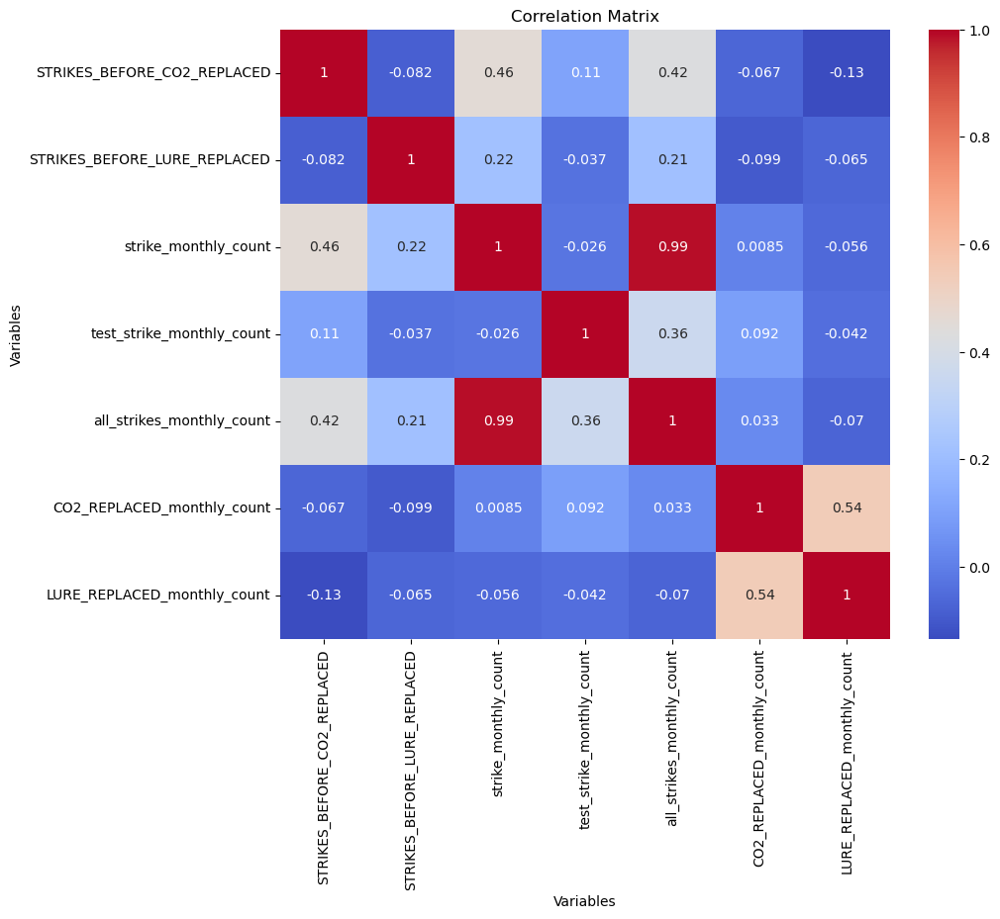

In [327]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your dataframe is called 'df_nz'
columns_of_interest = ['STRIKES_BEFORE_CO2_REPLACED', 'STRIKES_BEFORE_LURE_REPLACED', 'strike_monthly_count', 'test_strike_monthly_count', 'all_strikes_monthly_count',  'CO2_REPLACED_monthly_count', 'LURE_REPLACED_monthly_count']
correlation_matrix = filtered_df[columns_of_interest].corr()

# Create a heatmap plot
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', square=True)

# Set the title and labels
plt.title('Correlation Matrix')
plt.xlabel('Variables')
plt.ylabel('Variables')

# Show the plot
plt.show()


In [281]:
import pandas as pd

# Extract the year from the 'when' column
df_nz['Year'] = df_nz['when'].dt.year

# Group the data by 'trapId', 'Year', and 'when' month, and calculate the total counts
df_grouped = df_nz.groupby(['trapId', 'Year', df_nz['when'].dt.month]).agg(
    total_CO2_REPLACED=('CO2_REPLACED', 'sum'),
    total_LURE_REPLACED=('LURE_REPLACED', 'sum')
).reset_index()

# Display the resulting dataframe
df_grouped


,trapId,Year,when,total_CO2_REPLACED,total_LURE_REPLACED
0,1,2018,12,0,0
1,1,2019,1,0,0
2,2,2018,12,0,0
3,2,2019,1,0,0
4,3,2018,12,0,0
...,...,...,...,...,...
59729,32110,2021,8,0,0
59730,32115,2021,8,0,0
59731,32129,2021,8,0,0
59732,32132,2021,8,0,0


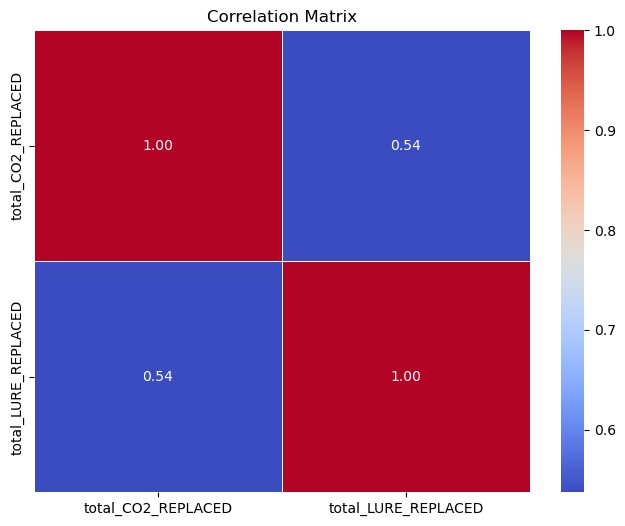

In [282]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = df_grouped[['total_CO2_REPLACED', 'total_LURE_REPLACED']].corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


In how many instances in the data is 'when' column values more recent than 'strikeTime' values?

This is important to know since we are looking at a monthly basis. It is better to have 'strikeTime' values that are in the same month & year as the 'when' values

so the time column has values like this:
Jun 2018
Aug 2021
etc. 
now give me the 

The data started getting received from the year 2018, so there might not be much data about the CO2 replaced that year

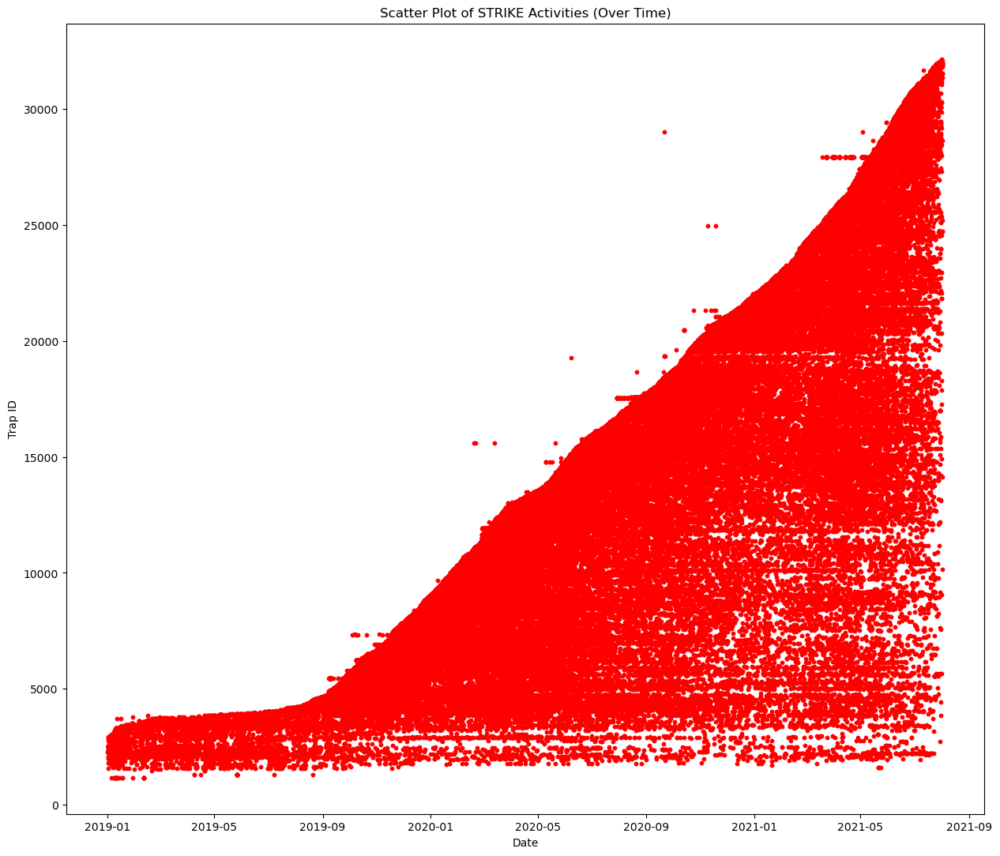

In [44]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_strikes = df_nz[(df_nz['strikeTime'].dt.year >= 2019) & (df_nz['strikeTime'].dt.year <= 2021) & (df_nz['activityType'] == 'STRIKE')]

# Set the figure size
plt.figure(figsize=(15, 13))

# Plot the scatter plot
plt.scatter(df_strikes['strikeTime'], df_strikes['trapId'], c='red', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of STRIKE Activities (Over Time)')

# Display the plot
plt.show()


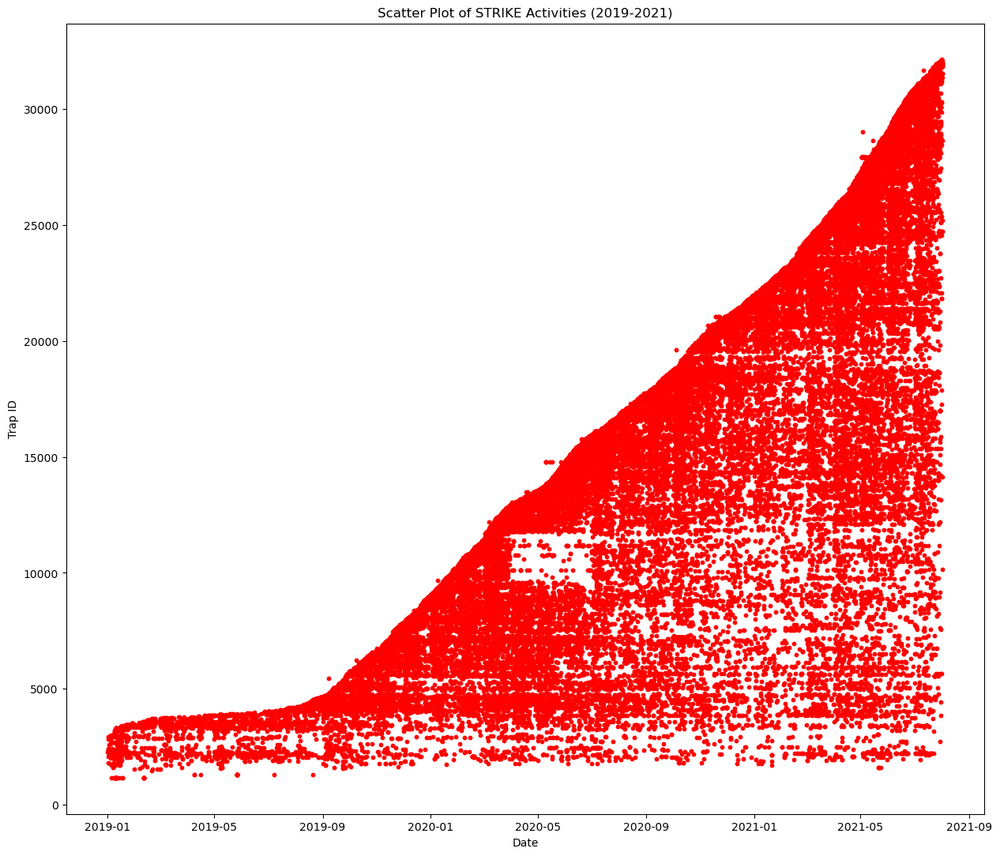

In [97]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_strikes = df_nz[(df_nz['strikeTime'].dt.year >= 2019) & (df_nz['strikeTime'].dt.year <= 2021) & (df_nz['activityType'] == 'STRIKE')]

# Set the figure size
plt.figure(figsize=(15, 13))

# Plot the scatter plot
plt.scatter(df_strikes['strikeTime'], df_strikes['trapId'], c='red', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of STRIKE Activities (2019-2021)')

# Display the plot
plt.show()


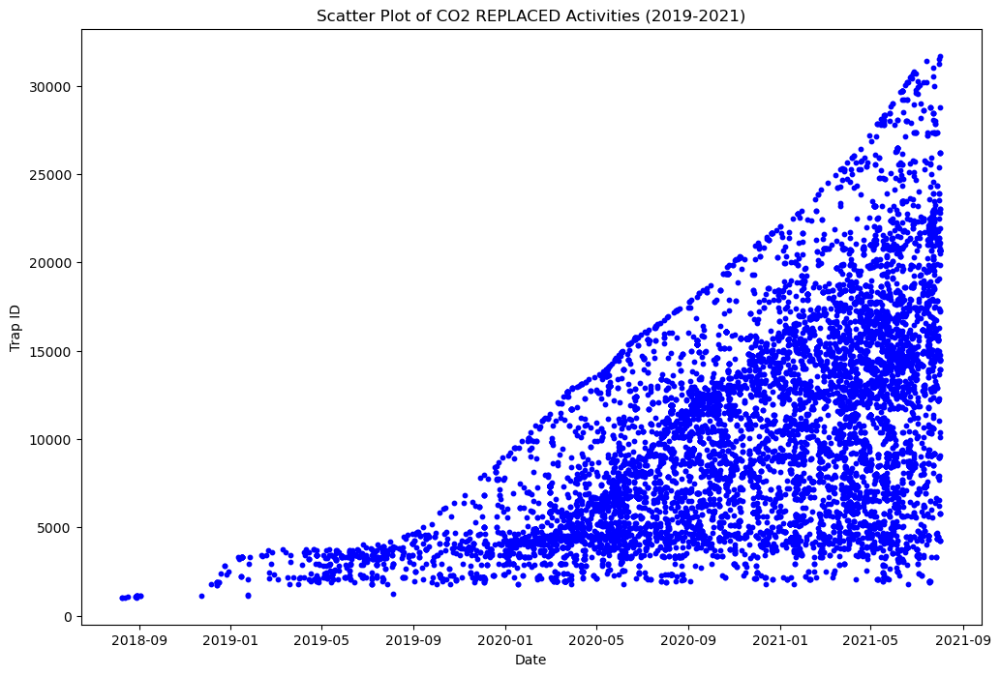

In [216]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = df_nz[(df_nz['when'].dt.year >= 2018) & (df_nz['when'].dt.year <= 2021) & (df_nz['activityType'] == 'CO2_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='BLUE', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of CO2 REPLACED Activities (2019-2021)')

# Display the plot
plt.show()


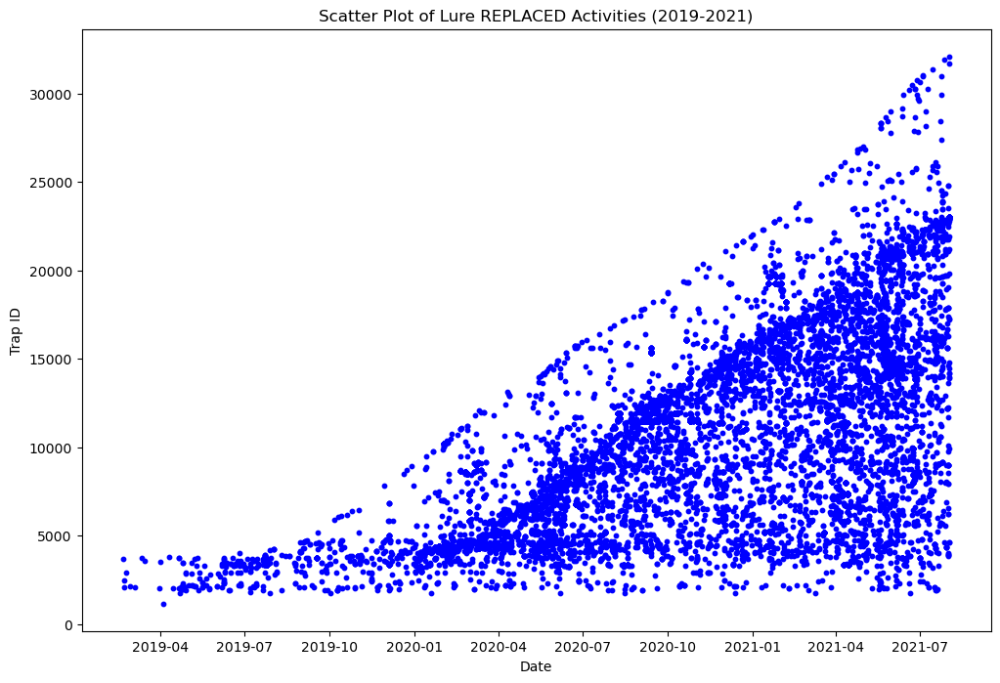

In [183]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = df_nz[(df_nz['when'].dt.year >= 2019) & (df_nz['when'].dt.year <= 2021) & (df_nz['activityType'] == 'LURE_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='BLUE', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of Lure REPLACED Activities (2019-2021)')

# Display the plot
plt.show()


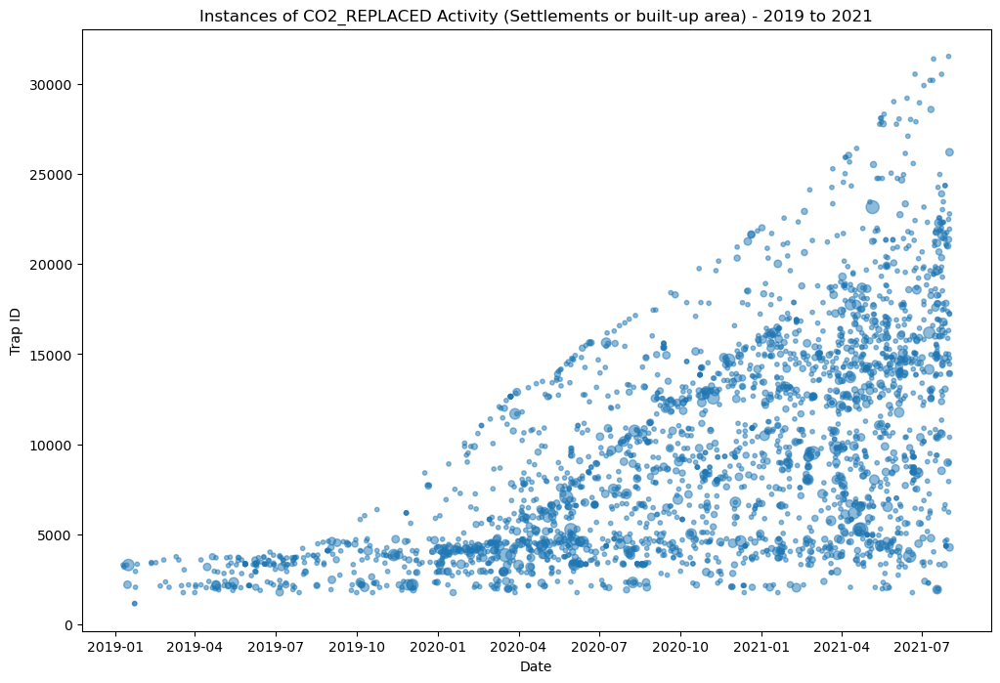

In [124]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Settlements or built-up area') & (df_nz['activityType'] == 'CO2_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with increased dot size
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of CO2_REPLACED Activity (Settlements or built-up area) - 2019 to 2021')

# Display the plot
plt.show()


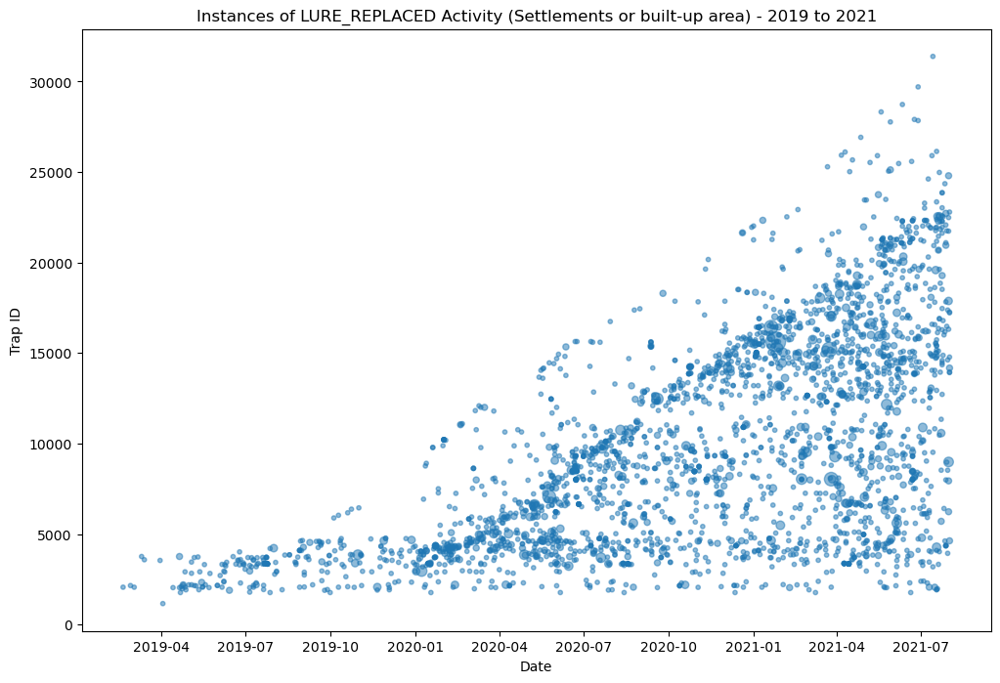

In [128]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Settlements or built-up area') & (df_nz['activityType'] == 'LURE_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with increased dot size
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of LURE_REPLACED Activity (Settlements or built-up area) - 2019 to 2021')

# Display the plot
plt.show()


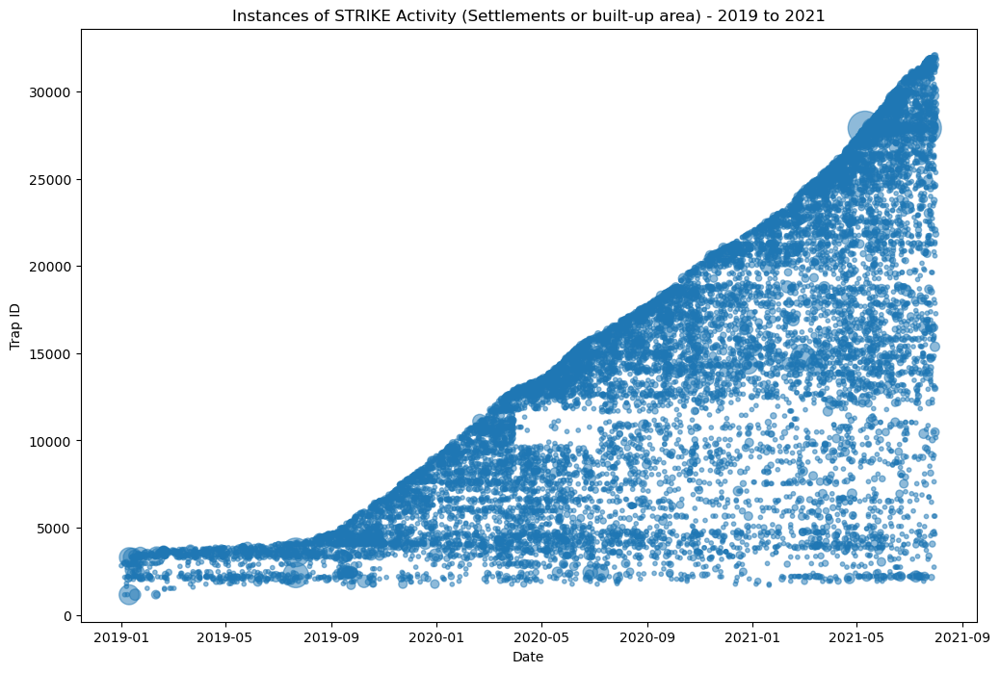

In [130]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Settlements or built-up area') & (df_nz['activityType'] == 'STRIKE')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with increased dot size
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of STRIKE Activity (Settlements or built-up area) - 2019 to 2021')

# Display the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Settlements or built-up area') & (df_nz['activityType'] == 'STRIKE')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with increased dot size
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of STRIKE Activity (Settlements or built-up area) - 2019 to 2021')

# Display the plot
plt.show()


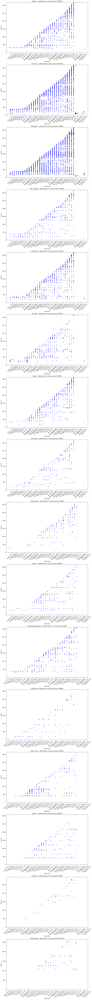

In [181]:
import matplotlib.pyplot as plt
import calendar
import numpy as np

# Define the land use type and activity type
land_use = 'Settlements or built-up area'
activity_type = 'STRIKE'

# Filter the dataset for the specified land use type and activity type
filtered_df = df_nz[(df_nz['landUse'] == land_use) & (df_nz['activityType'] == activity_type)]

# Get the unique regions
regions = filtered_df['region'].unique()

# Set the figure size
fig, axs = plt.subplots(len(regions), 1, figsize=(12, 8 * len(regions)))

# Create subplots for each region
for i, region in enumerate(regions):
    region_data = filtered_df[filtered_df['region'] == region]
    trap_ids = region_data['trapId'].unique()
    
    # Group the data by year and month to get the instances of CO2_REPLACED
    grouped_data = region_data.groupby([region_data['when'].dt.year.rename('year'), region_data['when'].dt.month.rename('month'), 'trapId']).size().reset_index(name='count')
    
    # Set the x-axis values as the month-year progression from 2019 to 2021
    x_values = [f"{calendar.month_name[month]}-{year}" for year in range(2019, 2022) for month in range(1, 13)]
    
    # Initialize the y-axis values with empty lists
    y_values = [[] for _ in range(len(x_values))]
    
    # Initialize the dot sizes with empty lists
    dot_sizes = [[] for _ in range(len(x_values))]
    
    # Update the y-axis values and dot sizes
    for idx, row in grouped_data.iterrows():
        year = row['year']
        month = row['month']
        trap_id = row['trapId']
        count = row['count']
        
        idx = (year - 2019) * 12 + (month - 1)
        y_values[idx].append(trap_id)
        dot_sizes[idx].append(count)
    
    # Generate random x-axis positions for scatter dots
    x_positions = [i for i in range(len(x_values)) for _ in range(len(y_values[i]))]
    
    # Flatten the y-axis values and dot sizes for scatter plot
    flattened_y = [trap_id for sublist in y_values for trap_id in sublist]
    flattened_sizes = [np.sqrt(size) * 10 for sublist in dot_sizes for size in sublist]
    
    # Plot the scatter dots with increased dot size
    ax = axs[i]
    ax.scatter(x_positions, flattened_y, s=flattened_sizes, marker='o', color='blue')
    
    # Set the x-axis label
    ax.set_xlabel('Month-Year')
    
    # Set the y-axis label
    ax.set_ylabel('Trap ID')
    
    # Set the title for each subplot
    ax.set_title(f'{region} - {land_use} ({activity_type})')
    
    # Set the x-axis tick labels as month-year progression
    ax.set_xticks(range(len(x_values)))
    ax.set_xticklabels(x_values, rotation=45)
    
    # Set the y-axis limits to fit all trapIds
    ax.set_ylim(0, max(flattened_y) + 1)
    
# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


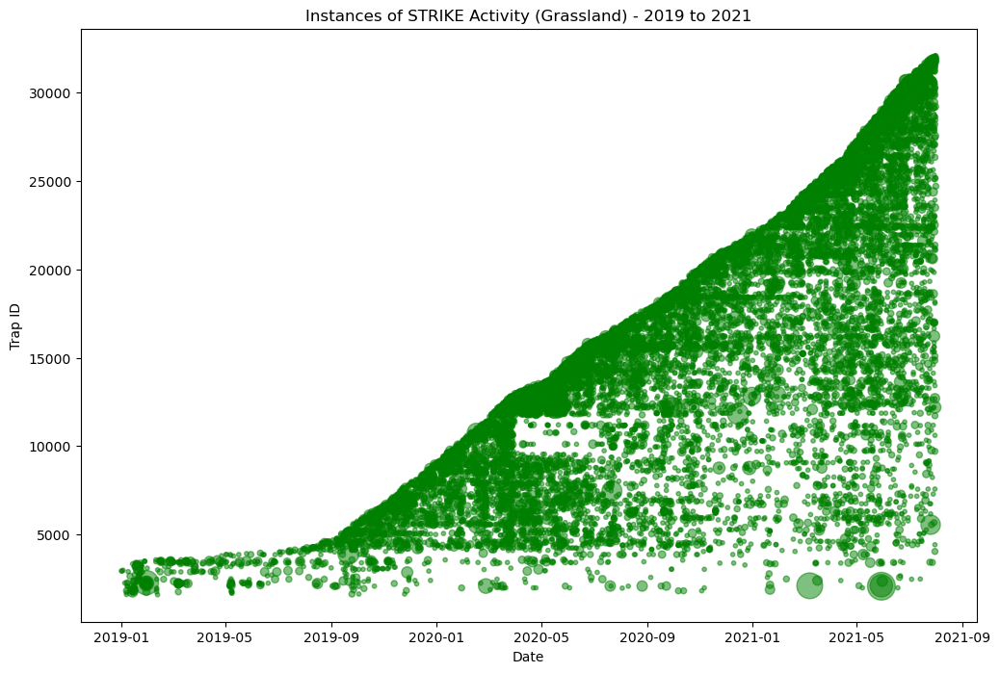

In [328]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Grassland') & (df_nz['activityType'] == 'STRIKE')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='green')

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of STRIKE Activity (Grassland) - 2019 to 2021')

# Display the plot
plt.show()


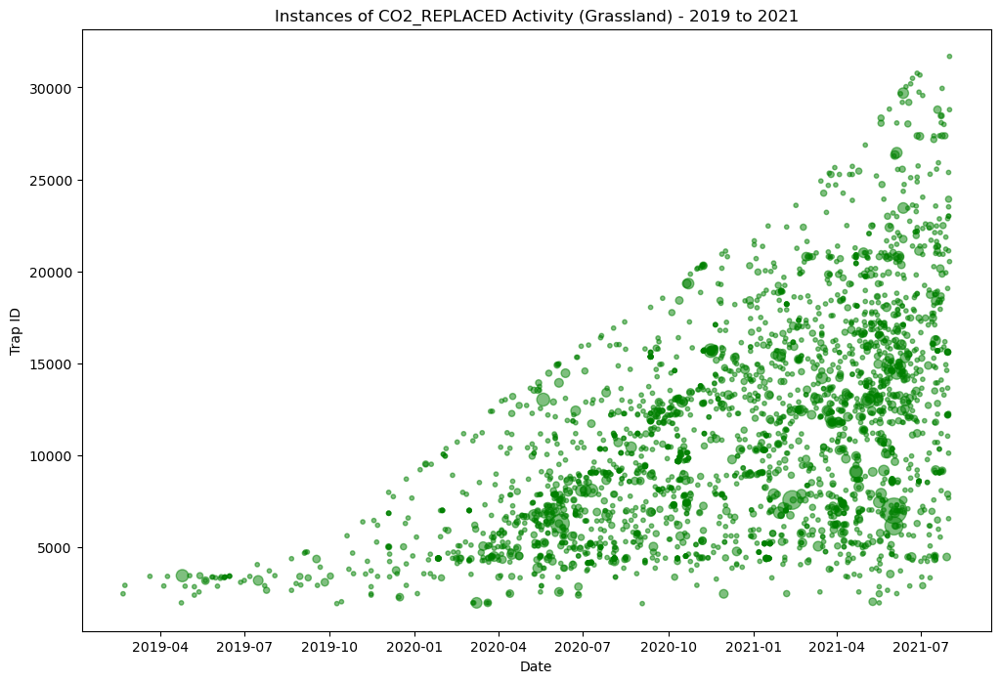

In [125]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Grassland') & (df_nz['activityType'] == 'CO2_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='green')

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of CO2_REPLACED Activity (Grassland) - 2019 to 2021')

# Display the plot
plt.show()


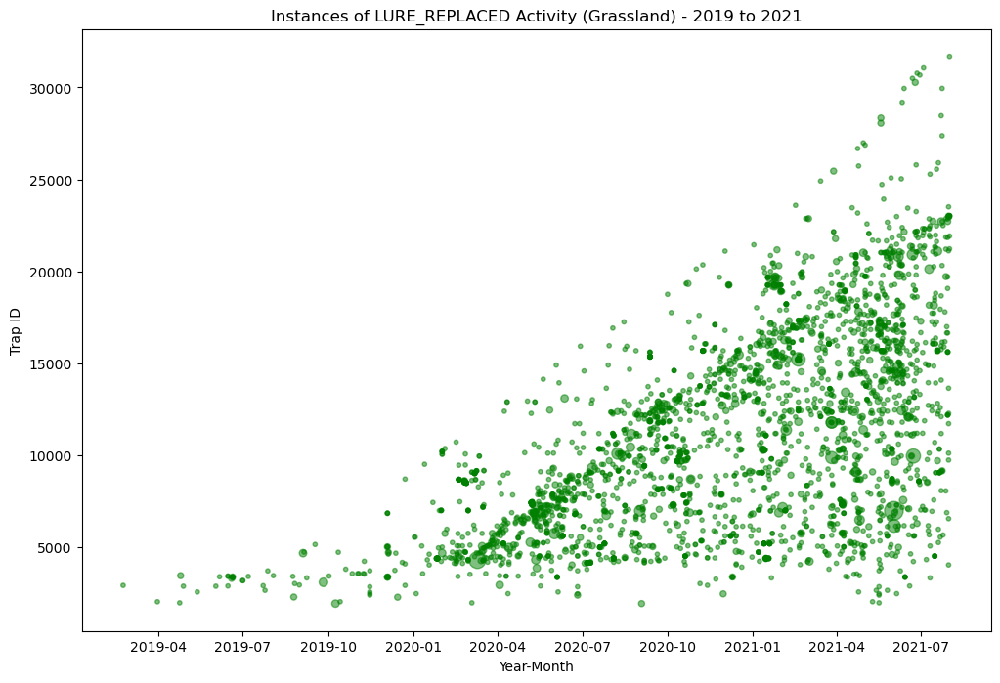

In [117]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Grassland') & (df_nz['activityType'] == 'LURE_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='green')

# Set the labels and title
plt.xlabel('Year-Month')
plt.ylabel('Trap ID')
plt.title('Instances of LURE_REPLACED Activity (Grassland) - 2019 to 2021')

# Display the plot
plt.show()


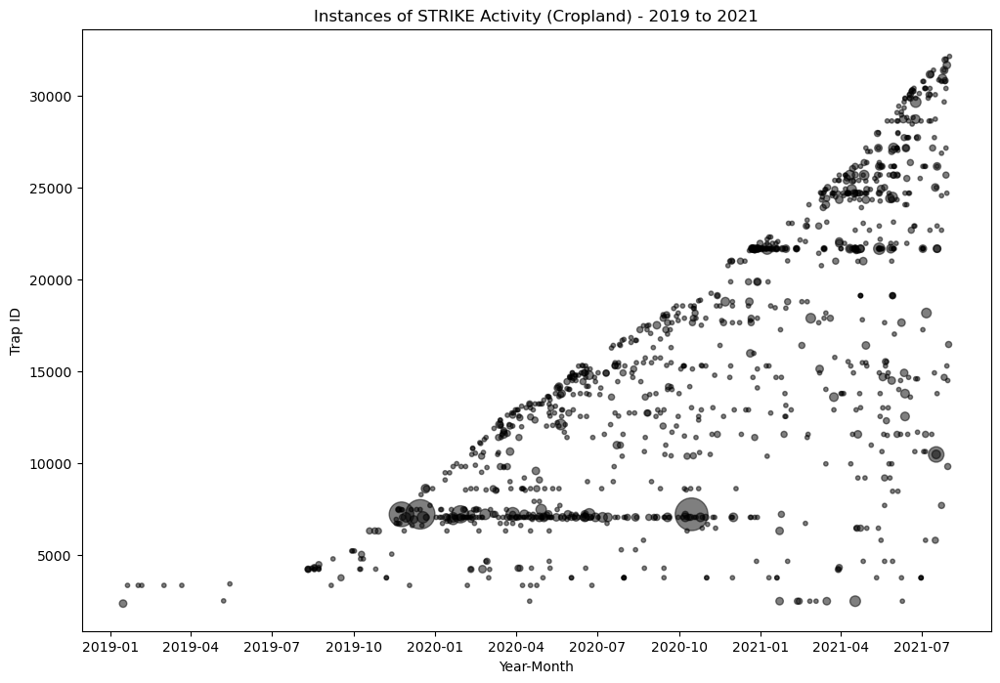

In [346]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Cropland') & (df_nz['activityType'] == 'STRIKE')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='black')

# Set the labels and title
plt.xlabel('Year-Month')
plt.ylabel('Trap ID')
plt.title('Instances of STRIKE Activity (Cropland) - 2019 to 2021')

# Display the plot
plt.show()


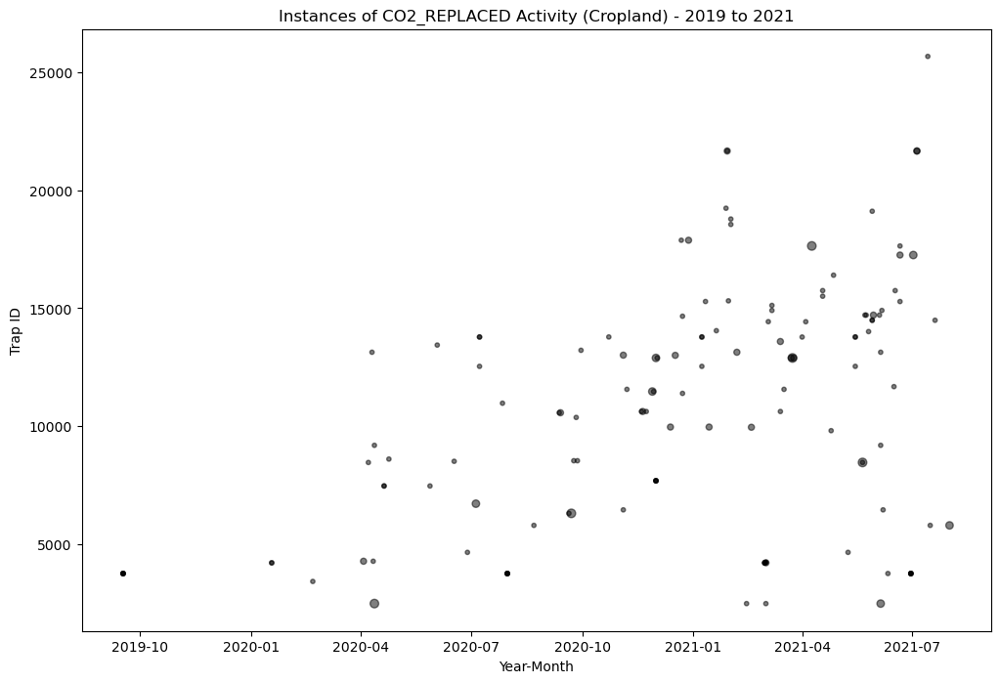

In [267]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = new_df[(new_df['landUse'] == 'Cropland') & (new_df['activityType'] == 'CO2_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='black')

# Set the labels and title
plt.xlabel('Year-Month')
plt.ylabel('Trap ID')
plt.title('Instances of CO2_REPLACED Activity (Cropland) - 2019 to 2021')

# Display the plot
plt.show()


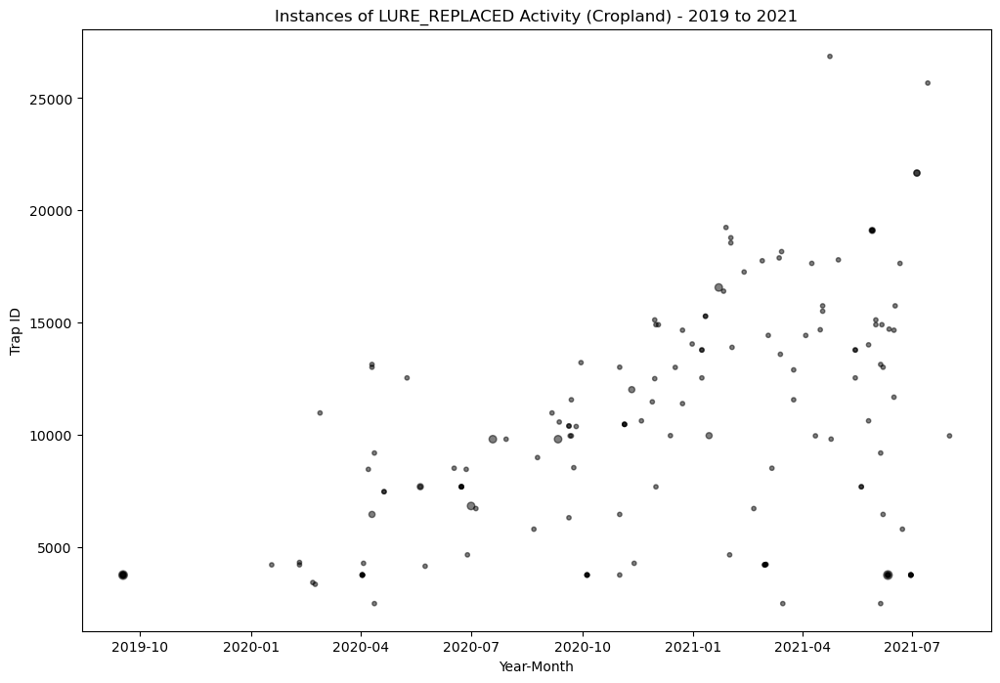

In [338]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = new_df[(new_df['landUse'] == 'Cropland') & (new_df['activityType'] == 'LURE_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='black')

# Set the labels and title
plt.xlabel('Year-Month')
plt.ylabel('Trap ID')
plt.title('Instances of LURE_REPLACED Activity (Cropland) - 2019 to 2021')

# Display the plot
plt.show()


### Other and Cropland don't have much data so we will remove them as another data cleaning step

In [22]:
new_df = new_df[new_df['landUse'] != 'Other']

In [ ]:
new_df = new_df[new_df['landUse'] != 'Cropland']

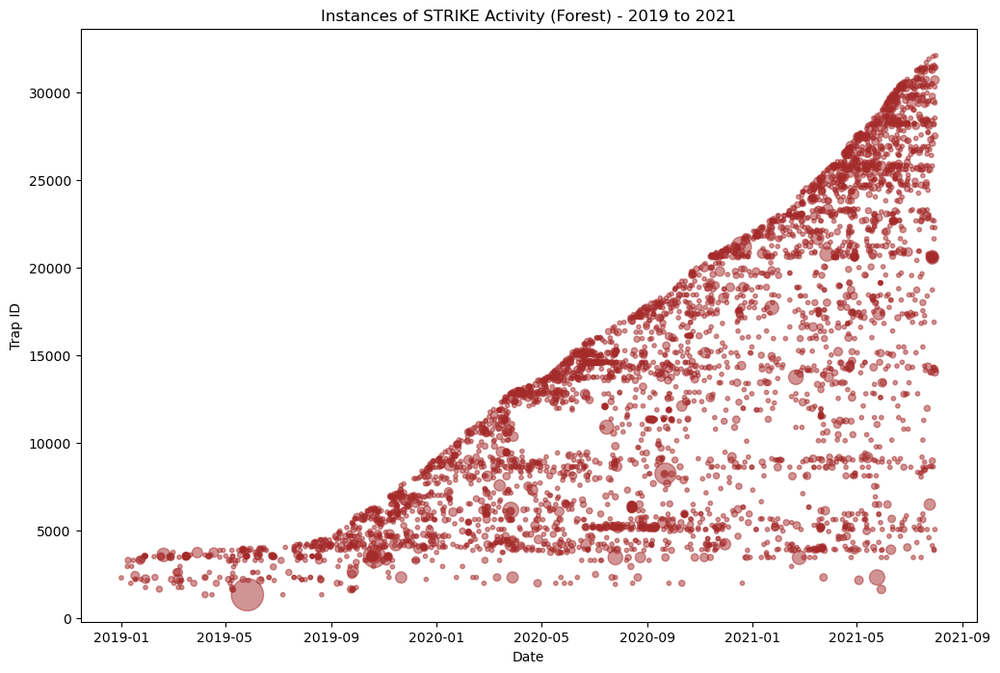

In [330]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Forest') & (df_nz['activityType'] == 'STRIKE')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='brown')

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of STRIKE Activity (Forest) - 2019 to 2021')

# Display the plot
plt.show()


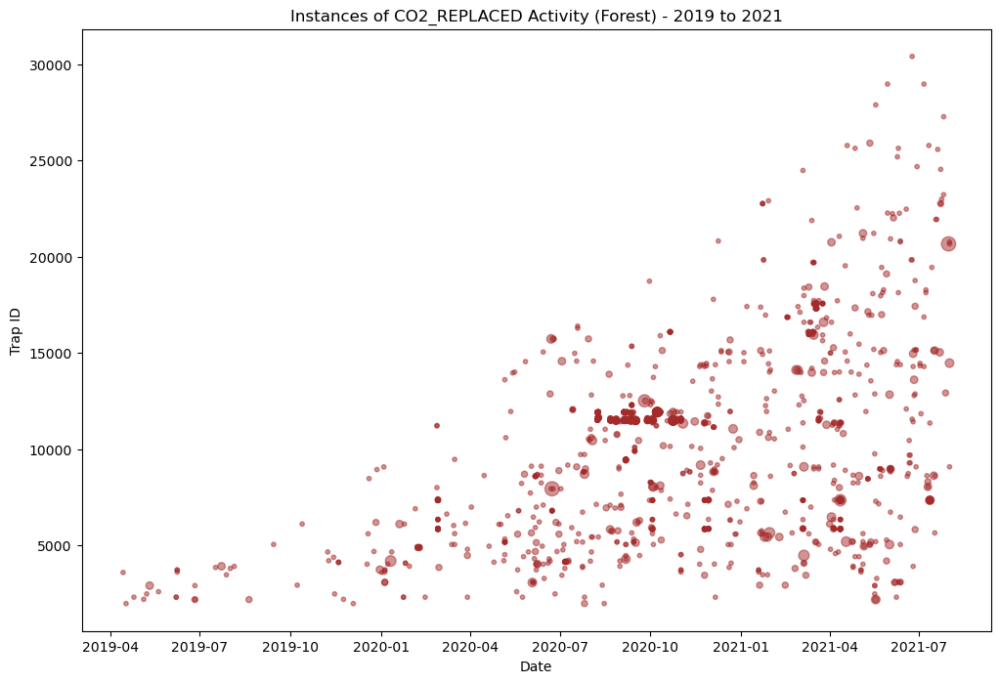

In [331]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Forest') & (df_nz['activityType'] == 'CO2_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='brown')

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of CO2_REPLACED Activity (Forest) - 2019 to 2021')

# Display the plot
plt.show()


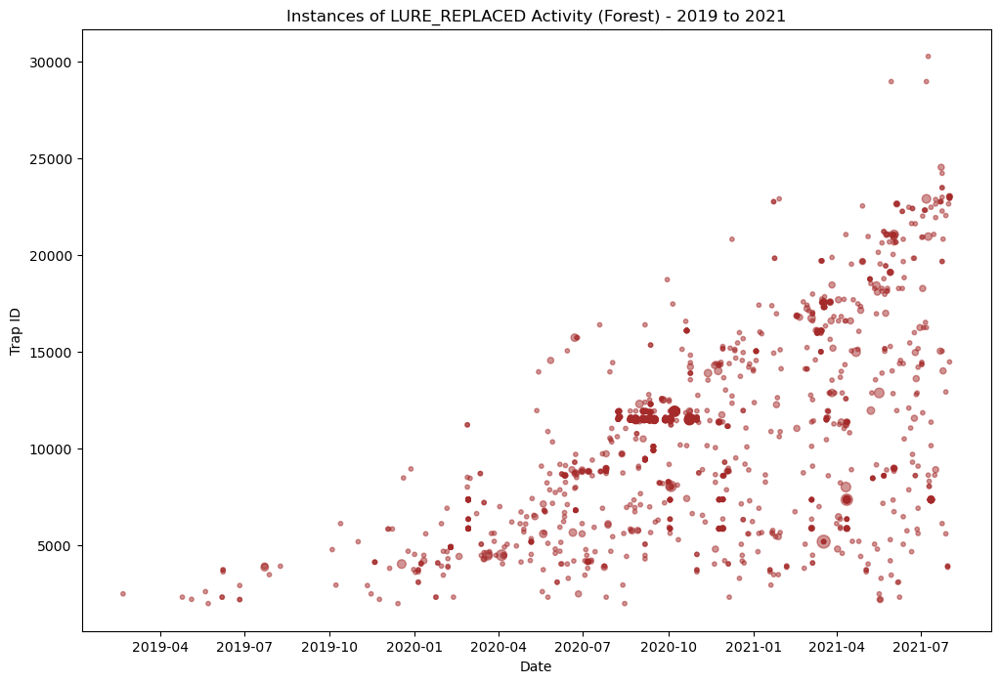

In [335]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Forest') & (df_nz['activityType'] == 'LURE_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='brown')

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Instances of LURE_REPLACED Activity (Forest) - 2019 to 2021')

# Display the plot
plt.show()


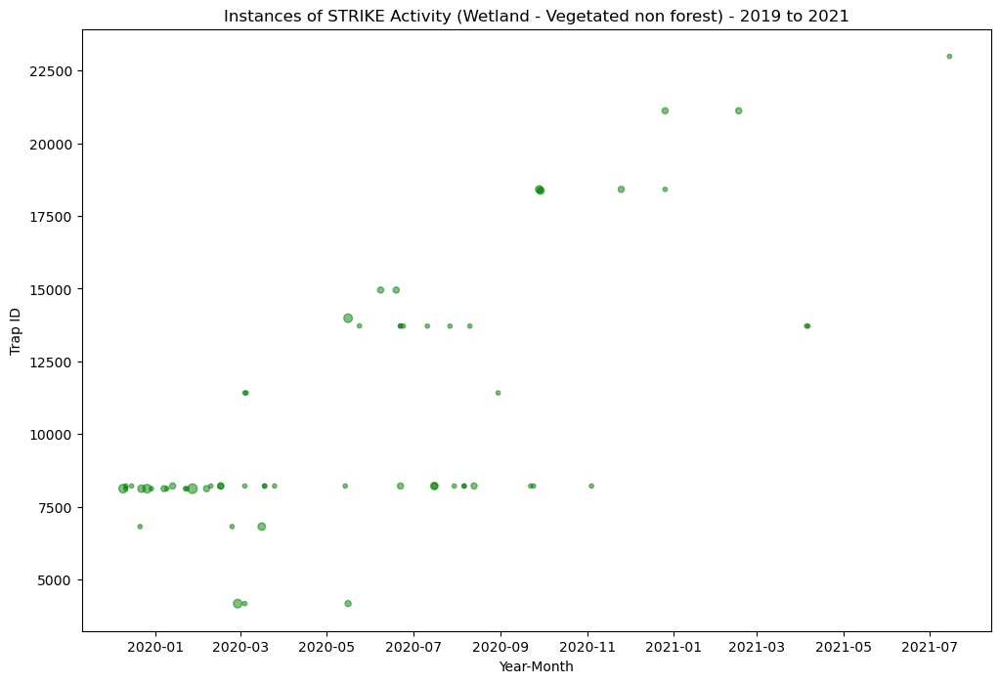

In [348]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = df_nz[(df_nz['landUse'] == 'Wetland - Vegetated non forest') & (df_nz['activityType'] == 'STRIKE')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='green')

# Set the labels and title
plt.xlabel('Year-Month')
plt.ylabel('Trap ID')
plt.title('Instances of STRIKE Activity (Wetland - Vegetated non forest) - 2019 to 2021')

# Display the plot
plt.show()


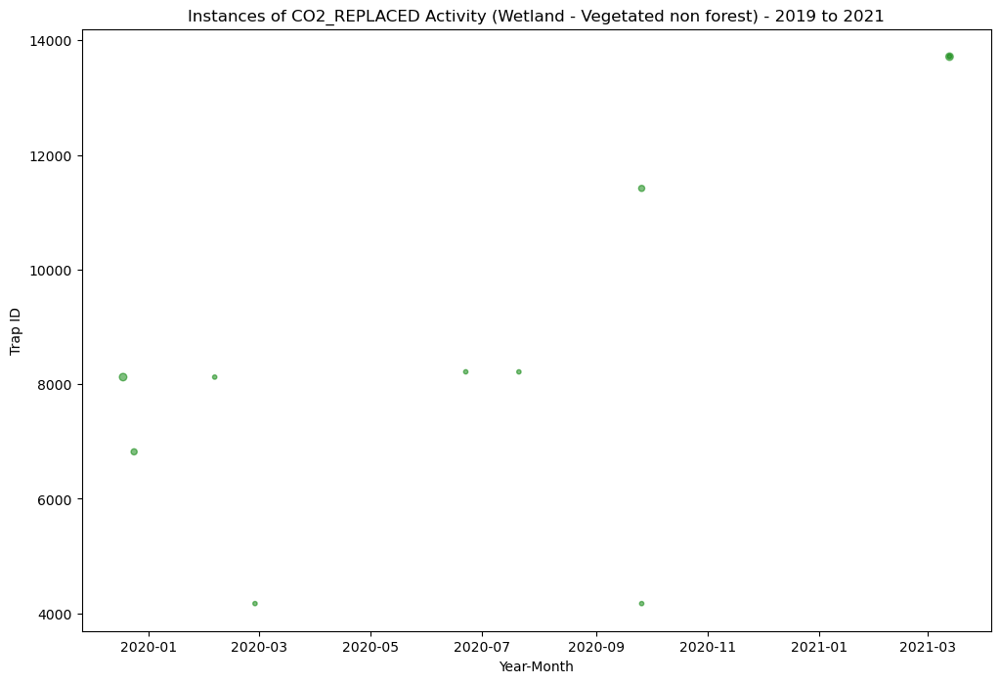

In [269]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = new_df[(new_df['landUse'] == 'Wetland - Vegetated non forest') & (new_df['activityType'] == 'CO2_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='green')

# Set the labels and title
plt.xlabel('Year-Month')
plt.ylabel('Trap ID')
plt.title('Instances of CO2_REPLACED Activity (Wetland - Vegetated non forest) - 2019 to 2021')

# Display the plot
plt.show()


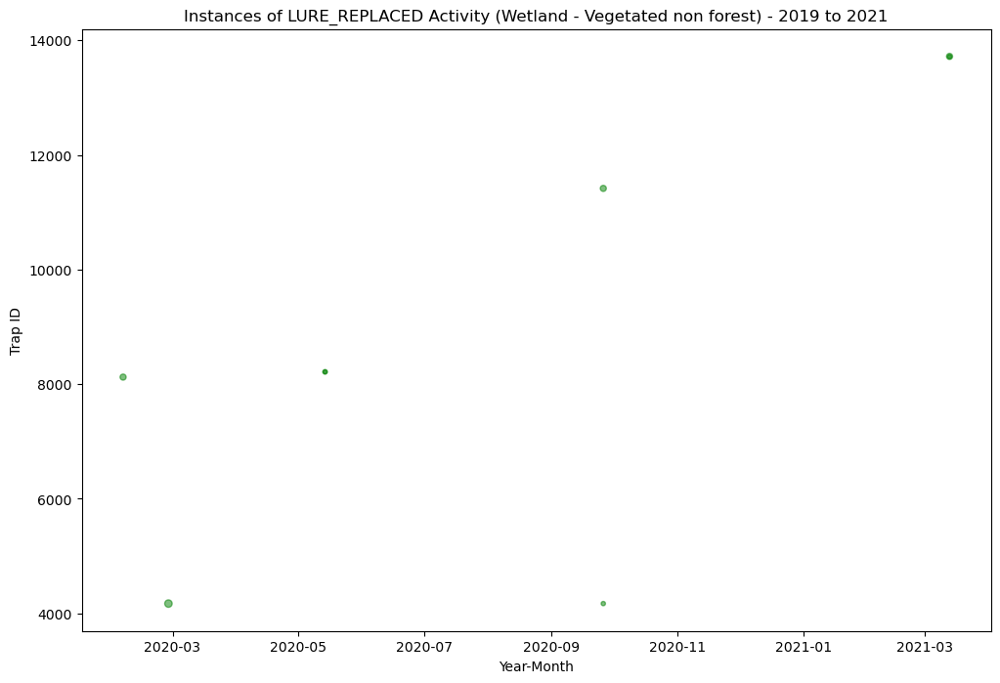

In [340]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the specified landUse and activityType
filtered_df = new_df[(new_df['landUse'] == 'Wetland - Vegetated non forest') & (new_df['activityType'] == 'LURE_REPLACED')]

# Filter the dataset for the years 2019 to 2021
df_2019_2021 = filtered_df[filtered_df['when'].dt.year.between(2019, 2021)]

# Group the data by trapId and date, and count the instances per trapId and date
daily_counts = df_2019_2021.groupby([df_2019_2021['when'].dt.date, df_2019_2021['trapId']]).size()

# Get the unique dates and trapIds
dates = daily_counts.index.get_level_values(0).unique()
trap_ids = daily_counts.index.get_level_values(1).unique()

# Create a grid of dates and trapIds
grid = pd.MultiIndex.from_product([dates, trap_ids], names=['date', 'trapId'])

# Fill missing values with 0
daily_counts = daily_counts.reindex(grid, fill_value=0)

# Reset the index by creating a DataFrame
daily_counts = daily_counts.reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot with green dots
plt.scatter(daily_counts['date'], daily_counts['trapId'], s=daily_counts[0] * 10, alpha=0.5, color='green')

# Set the labels and title
plt.xlabel('Year-Month')
plt.ylabel('Trap ID')
plt.title('Instances of LURE_REPLACED Activity (Wetland - Vegetated non forest) - 2019 to 2021')

# Display the plot
plt.show()


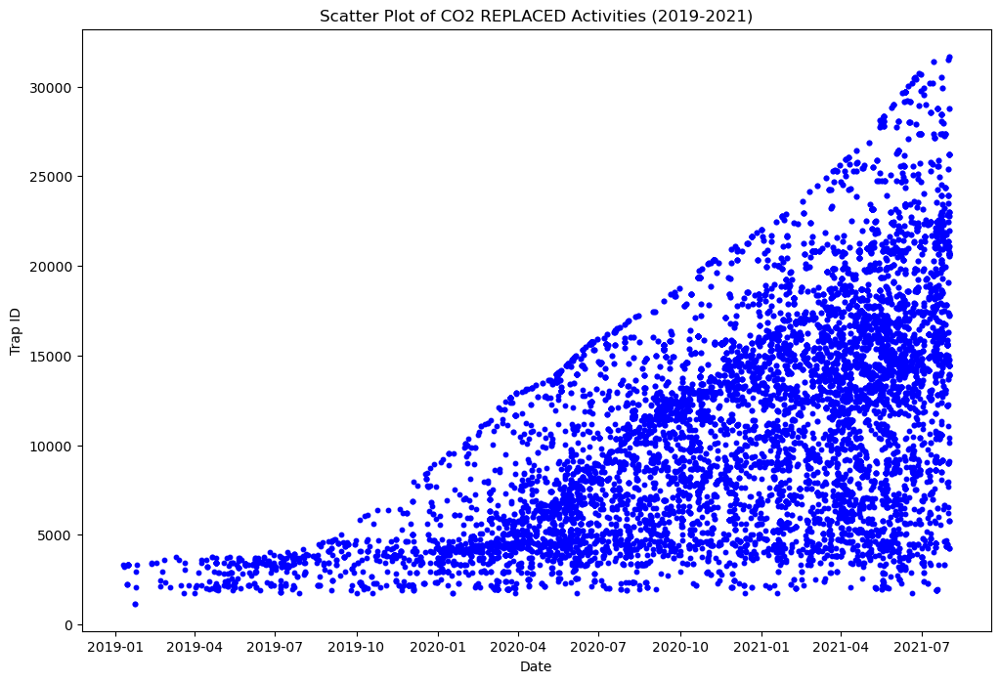

In [163]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = new_df[(new_df['when'].dt.year >= 2019) & (new_df['when'].dt.year <= 2021) & (new_df['activityType'] == 'CO2_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='BLUE', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of CO2 REPLACED Activities (2019-2021)')

# Display the plot
plt.show()


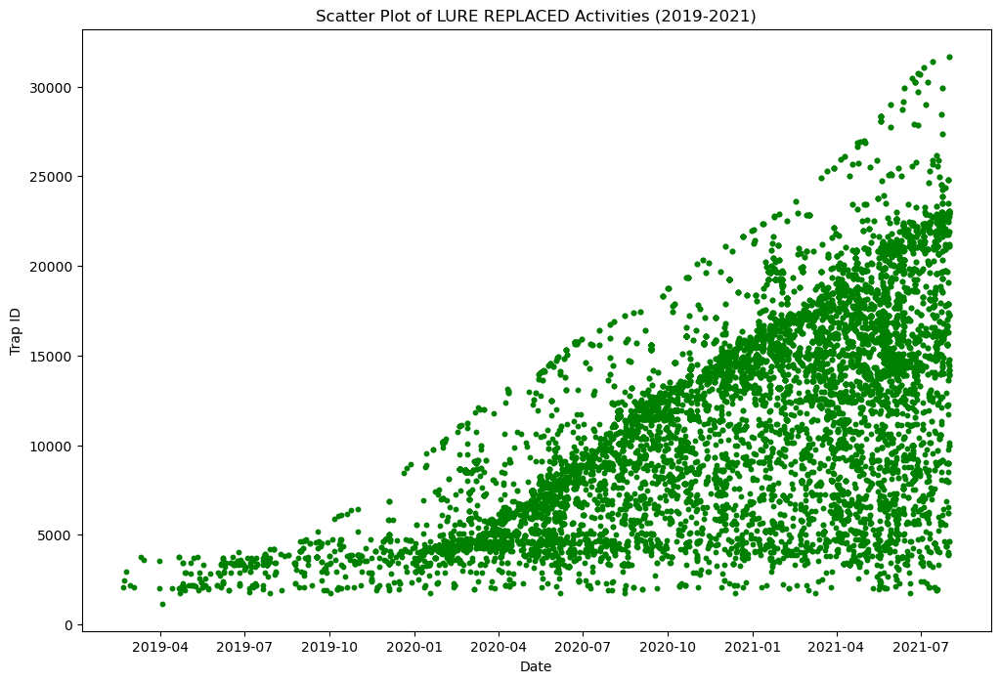

In [166]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = new_df[(new_df['when'].dt.year >= 2019) & (new_df['when'].dt.year <= 2021) & (new_df['activityType'] == 'LURE_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='GREEN', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of LURE REPLACED Activities (2019-2021)')

# Display the plot
plt.show()


### CO2 replaced over time per anuum

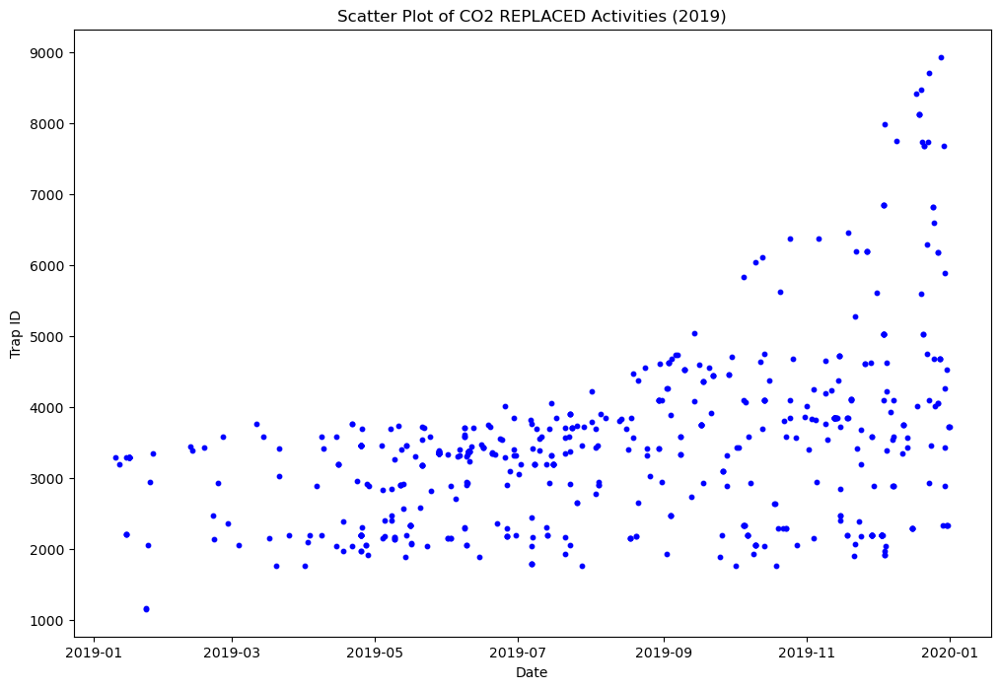

In [168]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = new_df[(new_df['when'].dt.year == 2019) & (new_df['activityType'] == 'CO2_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='BLUE', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of CO2 REPLACED Activities (2019)')

# Display the plot
plt.show()


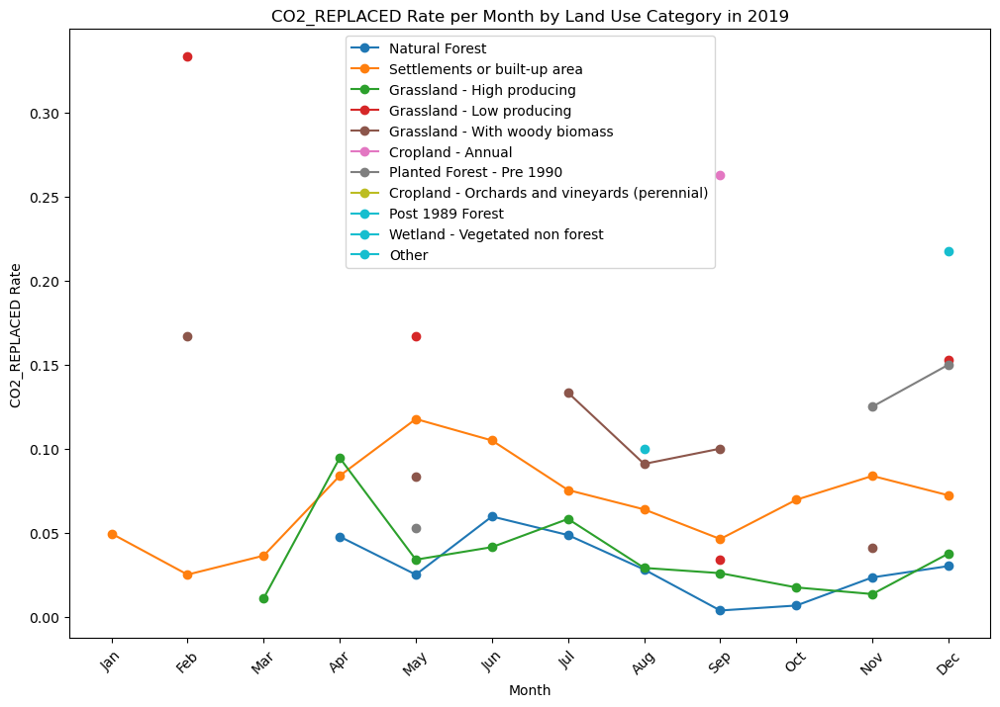

In [29]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the year 2019
df_2019 = df_nz[df_nz['when'].dt.year == 2019]

# Calculate the total count of CO2_REPLACED activities per month by landUse type
co2_replaced_counts = df_2019[df_2019['activityType'] == 'CO2_REPLACED'].groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the total count of all activity types per month by landUse type
activity_counts = df_2019.groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month by landUse type
co2_replaced_rate = co2_replaced_counts / activity_counts

# Set the figure size
plt.figure(figsize=(12, 8))

# Get unique landUse types
land_use_types = df_2019['landUse'].unique()

# Generate a color palette for landUse types
color_palette = plt.cm.get_cmap('tab10')

# Plot the line chart with different colored lines for each landUse type
for i, land_use_type in enumerate(land_use_types):
    if land_use_type in co2_replaced_rate.index.get_level_values(0):
        co2_replaced_rate_by_land_use = co2_replaced_rate.loc[land_use_type]
        x_labels = [pd.Timestamp(year=2019, month=month, day=1).strftime('%b') for month in co2_replaced_rate_by_land_use.index]
        plt.plot(x_labels, co2_replaced_rate_by_land_use.values, marker='o', label=land_use_type, color=color_palette(i))

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month by Land Use Category in 2019')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


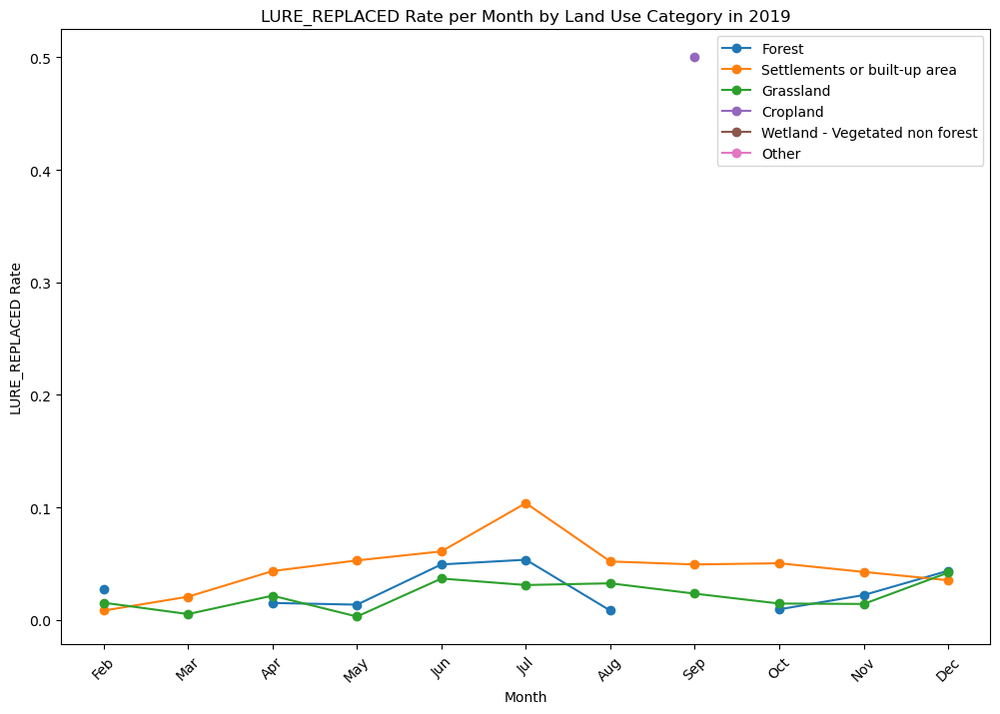

In [438]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the year 2019
df_2019 = df_nz[df_nz['when'].dt.year == 2019]

# Calculate the total count of CO2_REPLACED activities per month by landUse type
co2_replaced_counts = df_2019[df_2019['activityType'] == 'LURE_REPLACED'].groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the total count of all activity types per month by landUse type
activity_counts = df_2019.groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month by landUse type
co2_replaced_rate = co2_replaced_counts / activity_counts

# Set the figure size
plt.figure(figsize=(12, 8))

# Get unique landUse types
land_use_types = df_2019['landUse'].unique()

# Generate a color palette for landUse types
color_palette = plt.cm.get_cmap('tab10')

# Plot the line chart with different colored lines for each landUse type
for i, land_use_type in enumerate(land_use_types):
    if land_use_type in co2_replaced_rate.index.get_level_values(0):
        co2_replaced_rate_by_land_use = co2_replaced_rate.loc[land_use_type]
        x_labels = [pd.Timestamp(year=2019, month=month, day=1).strftime('%b') for month in co2_replaced_rate_by_land_use.index]
        plt.plot(x_labels, co2_replaced_rate_by_land_use.values, marker='o', label=land_use_type, color=color_palette(i))

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month by Land Use Category in 2019')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


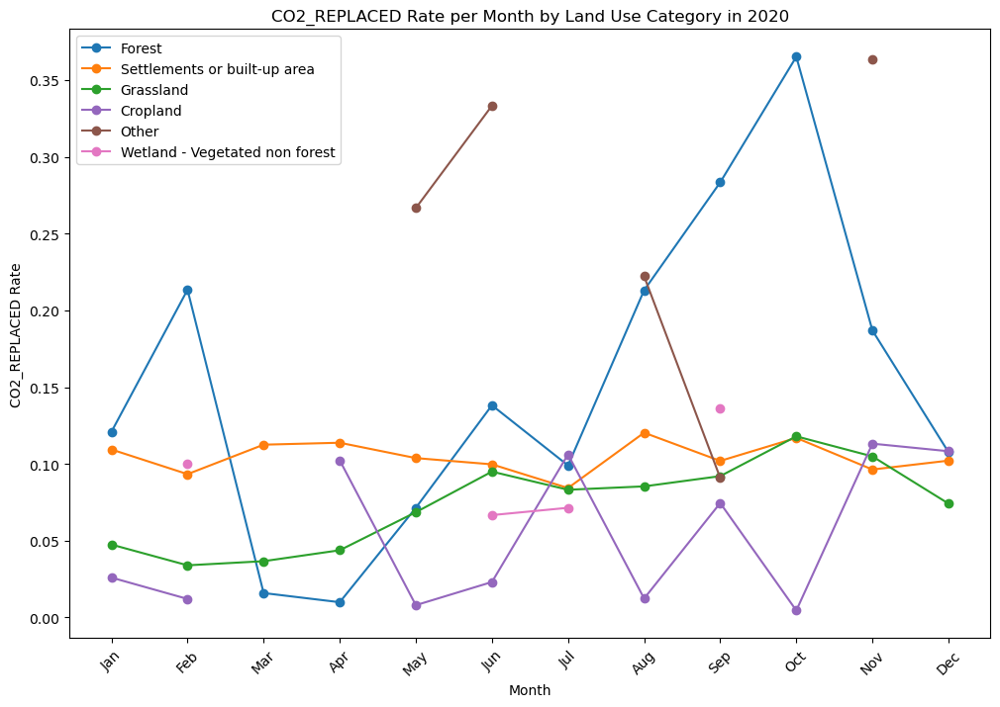

In [439]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the year 2019
df_2019 = df_nz[df_nz['when'].dt.year == 2020]

# Calculate the total count of CO2_REPLACED activities per month by landUse type
co2_replaced_counts = df_2019[df_2019['activityType'] == 'CO2_REPLACED'].groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the total count of all activity types per month by landUse type
activity_counts = df_2019.groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month by landUse type
co2_replaced_rate = co2_replaced_counts / activity_counts

# Set the figure size
plt.figure(figsize=(12, 8))

# Get unique landUse types
land_use_types = df_2019['landUse'].unique()

# Generate a color palette for landUse types
color_palette = plt.cm.get_cmap('tab10')

# Plot the line chart with different colored lines for each landUse type
for i, land_use_type in enumerate(land_use_types):
    if land_use_type in co2_replaced_rate.index.get_level_values(0):
        co2_replaced_rate_by_land_use = co2_replaced_rate.loc[land_use_type]
        x_labels = [pd.Timestamp(year=2019, month=month, day=1).strftime('%b') for month in co2_replaced_rate_by_land_use.index]
        plt.plot(x_labels, co2_replaced_rate_by_land_use.values, marker='o', label=land_use_type, color=color_palette(i))

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month by Land Use Category in 2020')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


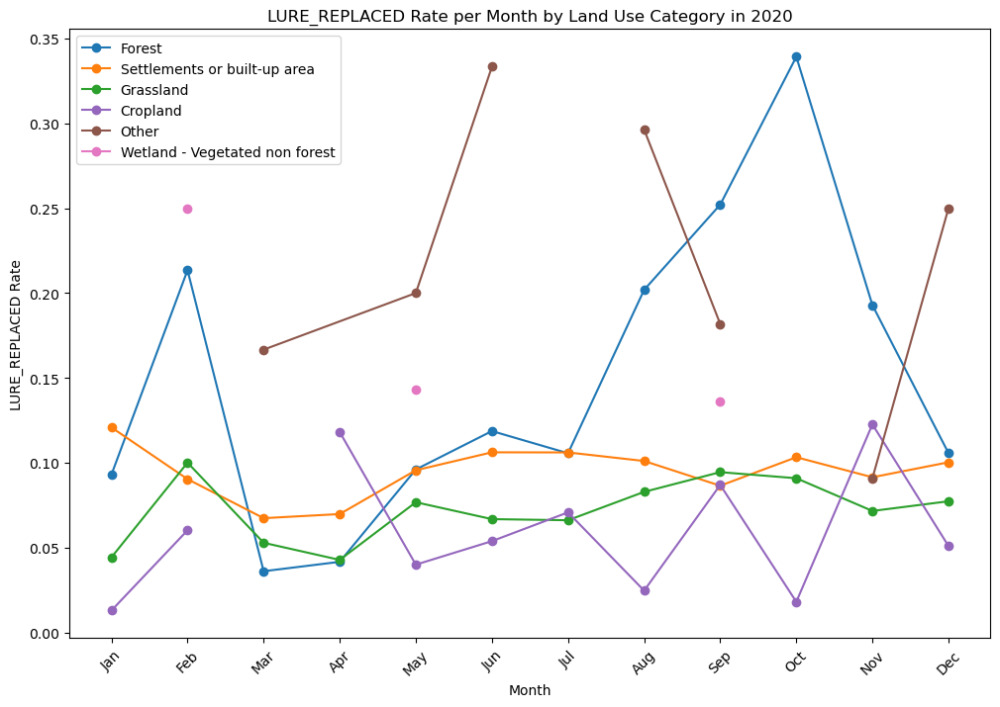

In [440]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the year 2019
df_2019 = df_nz[df_nz['when'].dt.year == 2020]

# Calculate the total count of CO2_REPLACED activities per month by landUse type
co2_replaced_counts = df_2019[df_2019['activityType'] == 'LURE_REPLACED'].groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the total count of all activity types per month by landUse type
activity_counts = df_2019.groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month by landUse type
co2_replaced_rate = co2_replaced_counts / activity_counts

# Set the figure size
plt.figure(figsize=(12, 8))

# Get unique landUse types
land_use_types = df_2019['landUse'].unique()

# Generate a color palette for landUse types
color_palette = plt.cm.get_cmap('tab10')

# Plot the line chart with different colored lines for each landUse type
for i, land_use_type in enumerate(land_use_types):
    if land_use_type in co2_replaced_rate.index.get_level_values(0):
        co2_replaced_rate_by_land_use = co2_replaced_rate.loc[land_use_type]
        x_labels = [pd.Timestamp(year=2019, month=month, day=1).strftime('%b') for month in co2_replaced_rate_by_land_use.index]
        plt.plot(x_labels, co2_replaced_rate_by_land_use.values, marker='o', label=land_use_type, color=color_palette(i))

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month by Land Use Category in 2020')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


In [22]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the year 2019
df_2019 = df_nz[df_nz['when'].dt.year == 2021]

# Calculate the total count of CO2_REPLACED activities per month by landUse type
co2_replaced_counts = df_2019[df_2019['activityType'] == 'CO2_REPLACED'].groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the total count of all activity types per month by landUse type
activity_counts = df_2019.groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month by landUse type
co2_replaced_rate = co2_replaced_counts / activity_counts

# Set the figure size
plt.figure(figsize=(12, 8))

# Get unique landUse types
land_use_types = df_2019['landUse'].unique()

# Generate a color palette for landUse types
color_palette = plt.cm.get_cmap('tab10')

# Plot the line chart with different colored lines for each landUse type
for i, land_use_type in enumerate(land_use_types):
    if land_use_type in co2_replaced_rate.index.get_level_values(0):
        co2_replaced_rate_by_land_use = co2_replaced_rate.loc[land_use_type]
        x_labels = [pd.Timestamp(year=2019, month=month, day=1).strftime('%b') for month in co2_replaced_rate_by_land_use.index]
        plt.plot(x_labels, co2_replaced_rate_by_land_use.values, marker='o', label=land_use_type, color=color_palette(i))

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month by Land Use Category in 2021')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


KeyError: 'landUse'

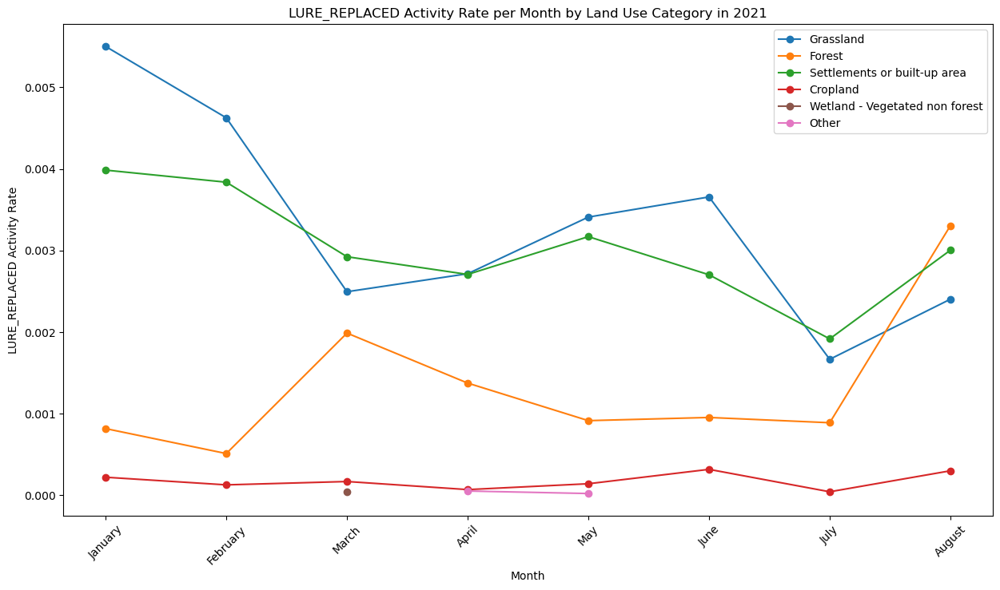

In [442]:
import matplotlib.pyplot as plt
import calendar

# Filter the dataset for the year 2019 and CO2_REPLACED activityType
df_2019 = new_df[new_df['when'].dt.year == 2021]
co2_replaced_counts_per_month = df_2019[df_2019['activityType'] == 'LURE_REPLACED'].groupby(['landUse', df_2019['when'].dt.month])['activityType'].count()
activity_counts_per_month = df_2019.groupby([df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month
co2_replaced_rate_per_month = co2_replaced_counts_per_month / activity_counts_per_month

# Set the figure size
plt.figure(figsize=(15, 8))

# Get unique landUse types
land_use_types = df_2019['landUse'].unique()

# Generate a color palette for landUse types
color_palette = plt.cm.get_cmap('tab10')

# Plot the line chart with markers for each landUse type
for i, land_use_type in enumerate(land_use_types):
    if land_use_type in co2_replaced_rate_per_month.index.get_level_values(0):
        co2_replaced_rate = co2_replaced_rate_per_month.loc[land_use_type]
        x_labels = [calendar.month_name[month] for month in co2_replaced_rate.index]
        plt.plot(x_labels, co2_replaced_rate.values, marker='o', label=land_use_type, color=color_palette(i))

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Activity Rate')
plt.title('LURE_REPLACED Activity Rate per Month by Land Use Category in 2021')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


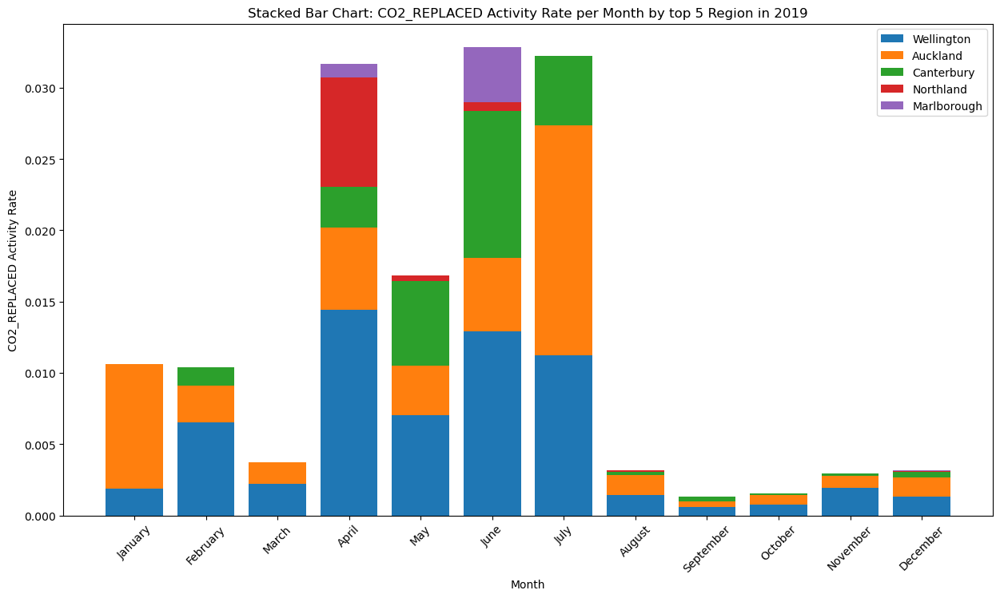

In [640]:
import matplotlib.pyplot as plt
import calendar

# Filter the dataset for the year 2019 and CO2_REPLACED activityType
df_2019 = new_df[new_df['when'].dt.year == 2019]
co2_replaced_counts_per_month = df_2019[df_2019['activityType'] == 'CO2_REPLACED'].groupby(['region', df_2019['when'].dt.month])['activityType'].count()
activity_counts_per_month = df_2019.groupby([df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month
co2_replaced_rate_per_month = co2_replaced_counts_per_month / activity_counts_per_month

# Get the top 5 regions based on CO2_REPLACED rate
top_regions = co2_replaced_rate_per_month.groupby(level=0).mean().nlargest(5).index

# Set the figure size
plt.figure(figsize=(15, 8))

# Get unique regions
regions = df_2019['region'].unique()

# Generate a color palette for regions
color_palette = plt.cm.get_cmap('tab10')

# Get the x-axis labels (month names)
x_labels = [calendar.month_name[month] for month in range(1, 13)]

# Initialize the bottom array
bottom = None

# Plot the stacked bars for each top region
for i, region in enumerate(top_regions):
    if region in co2_replaced_rate_per_month.index.get_level_values(0):
        co2_replaced_rate = co2_replaced_rate_per_month.loc[region]
        values = co2_replaced_rate.reindex(range(1, 13), fill_value=0).values
        plt.bar(x_labels, values, bottom=bottom, label=region, color=color_palette(i))
        if bottom is None:
            bottom = values
        else:
            bottom += values

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Activity Rate')
plt.title('Stacked Bar Chart: CO2_REPLACED Activity Rate per Month by top 5 Region in 2019')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


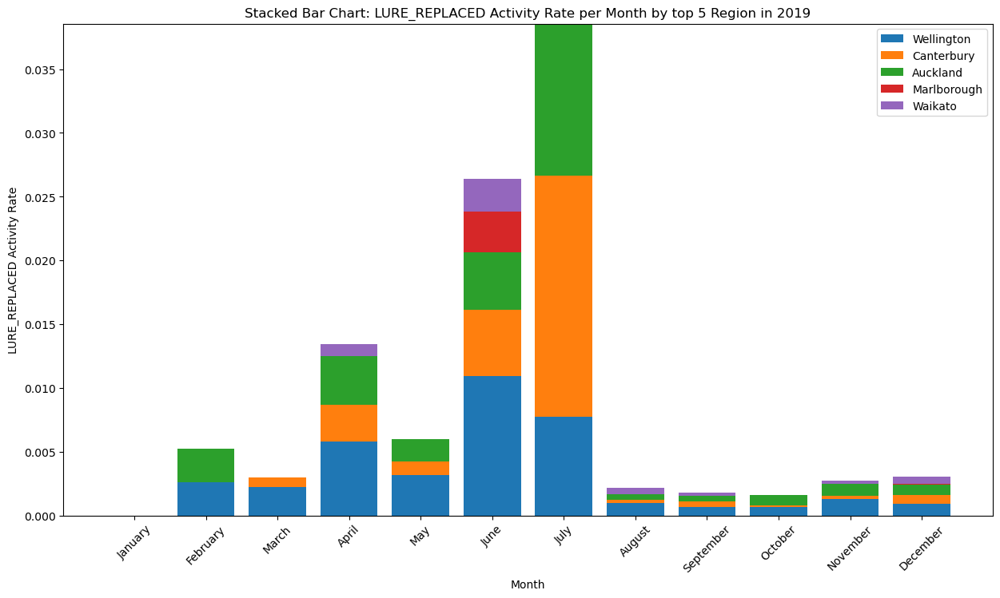

In [ ]:
import matplotlib.pyplot as plt
import calendar

# Filter the dataset for the year 2019 and CO2_REPLACED activityType
df_2019 = new_df[new_df['when'].dt.year == 2019]
co2_replaced_counts_per_month = df_2019[df_2019['activityType'] == 'LURE_REPLACED'].groupby(['region', df_2019['when'].dt.month])['activityType'].count()
activity_counts_per_month = df_2019.groupby([df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month
co2_replaced_rate_per_month = co2_replaced_counts_per_month / activity_counts_per_month

# Get the top 5 regions based on CO2_REPLACED rate
top_regions = co2_replaced_rate_per_month.groupby(level=0).mean().nlargest(5).index

# Set the figure size
plt.figure(figsize=(15, 8))

# Get unique regions
regions = df_2019['region'].unique()

# Generate a color palette for regions
color_palette = plt.cm.get_cmap('tab10')

# Get the x-axis labels (month names)
x_labels = [calendar.month_name[month] for month in range(1, 13)]

# Initialize the bottom array
bottom = None

# Plot the stacked bars for each top region
for i, region in enumerate(top_regions):
    if region in co2_replaced_rate_per_month.index.get_level_values(0):
        co2_replaced_rate = co2_replaced_rate_per_month.loc[region]
        values = co2_replaced_rate.reindex(range(1, 13), fill_value=0).values
        plt.bar(x_labels, values, bottom=bottom, label=region, color=color_palette(i))
        if bottom is None:
            bottom = values
        else:
            bottom += values

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Activity Rate')
plt.title('Stacked Bar Chart: LURE_REPLACED Activity Rate per Month by top 5 Region in 2019')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


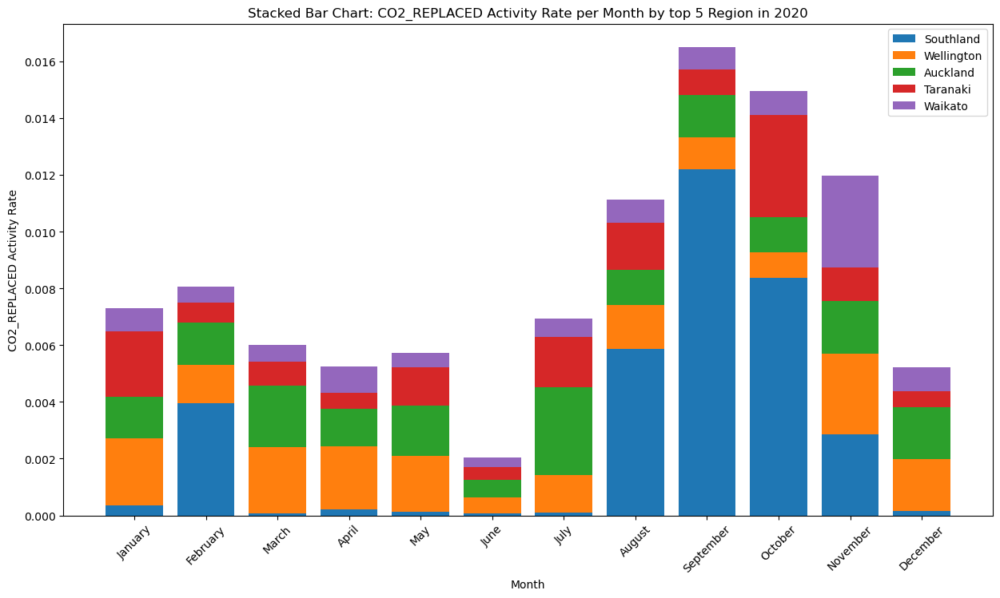

In [506]:
import matplotlib.pyplot as plt
import calendar

# Filter the dataset for the year 2019 and CO2_REPLACED activityType
df_2019 = new_df[new_df['when'].dt.year == 2020]
co2_replaced_counts_per_month = df_2019[df_2019['activityType'] == 'CO2_REPLACED'].groupby(['region', df_2019['when'].dt.month])['activityType'].count()
activity_counts_per_month = df_2019.groupby([df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month
co2_replaced_rate_per_month = co2_replaced_counts_per_month / activity_counts_per_month

# Get the top 5 regions based on CO2_REPLACED rate
top_regions = co2_replaced_rate_per_month.groupby(level=0).mean().nlargest(5).index

# Set the figure size
plt.figure(figsize=(15, 8))

# Get unique regions
regions = df_2019['region'].unique()

# Generate a color palette for regions
color_palette = plt.cm.get_cmap('tab10')

# Get the x-axis labels (month names)
x_labels = [calendar.month_name[month] for month in range(1, 13)]

# Initialize the bottom array
bottom = None

# Plot the stacked bars for each top region
for i, region in enumerate(top_regions):
    if region in co2_replaced_rate_per_month.index.get_level_values(0):
        co2_replaced_rate = co2_replaced_rate_per_month.loc[region]
        values = co2_replaced_rate.reindex(range(1, 13), fill_value=0).values
        plt.bar(x_labels, values, bottom=bottom, label=region, color=color_palette(i))
        if bottom is None:
            bottom = values
        else:
            bottom += values

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Activity Rate')
plt.title('Stacked Bar Chart: CO2_REPLACED Activity Rate per Month by top 5 Region in 2020')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


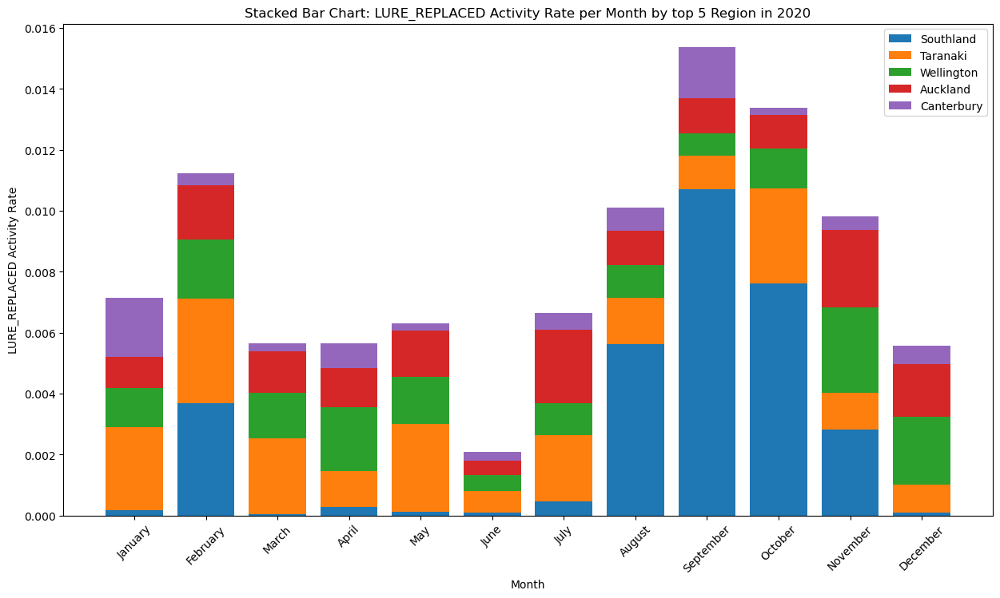

In [512]:
import matplotlib.pyplot as plt
import calendar

# Filter the dataset for the year 2019 and CO2_REPLACED activityType
df_2019 = new_df[new_df['when'].dt.year == 2020]
co2_replaced_counts_per_month = df_2019[df_2019['activityType'] == 'LURE_REPLACED'].groupby(['region', df_2019['when'].dt.month])['activityType'].count()
activity_counts_per_month = df_2019.groupby([df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month
co2_replaced_rate_per_month = co2_replaced_counts_per_month / activity_counts_per_month

# Get the top 5 regions based on CO2_REPLACED rate
top_regions = co2_replaced_rate_per_month.groupby(level=0).mean().nlargest(5).index

# Set the figure size
plt.figure(figsize=(15, 8))

# Get unique regions
regions = df_2019['region'].unique()

# Generate a color palette for regions
color_palette = plt.cm.get_cmap('tab10')

# Get the x-axis labels (month names)
x_labels = [calendar.month_name[month] for month in range(1, 13)]

# Initialize the bottom array
bottom = None

# Plot the stacked bars for each top region
for i, region in enumerate(top_regions):
    if region in co2_replaced_rate_per_month.index.get_level_values(0):
        co2_replaced_rate = co2_replaced_rate_per_month.loc[region]
        values = co2_replaced_rate.reindex(range(1, 13), fill_value=0).values
        plt.bar(x_labels, values, bottom=bottom, label=region, color=color_palette(i))
        if bottom is None:
            bottom = values
        else:
            bottom += values

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Activity Rate')
plt.title('Stacked Bar Chart: LURE_REPLACED Activity Rate per Month by top 5 Region in 2020')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


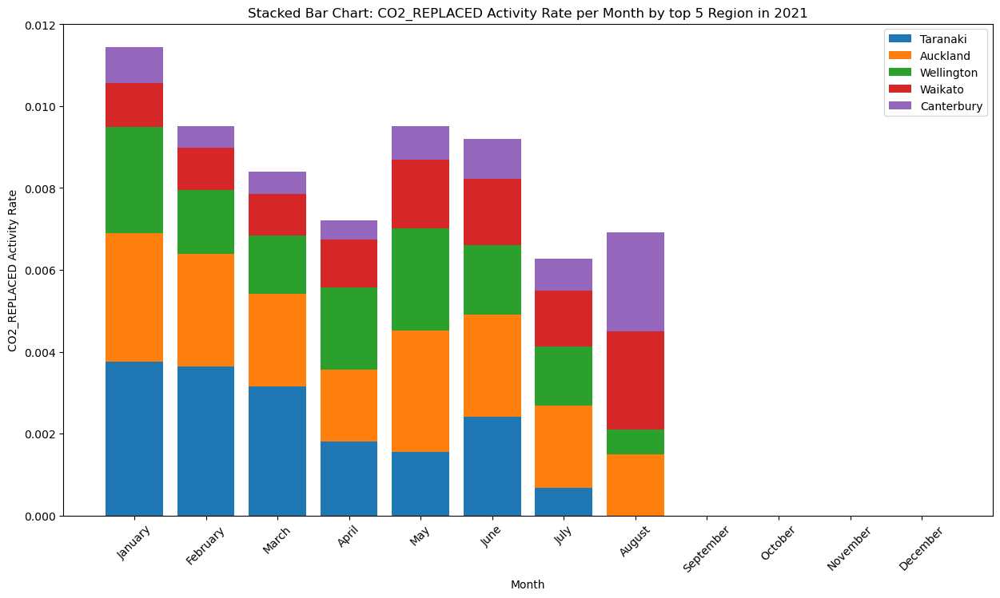

In [516]:
import matplotlib.pyplot as plt
import calendar

# Filter the dataset for the year 2019 and CO2_REPLACED activityType
df_2019 = new_df[new_df['when'].dt.year == 2021]
co2_replaced_counts_per_month = df_2019[df_2019['activityType'] == 'CO2_REPLACED'].groupby(['region', df_2019['when'].dt.month])['activityType'].count()
activity_counts_per_month = df_2019.groupby([df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month
co2_replaced_rate_per_month = co2_replaced_counts_per_month / activity_counts_per_month

# Get the top 5 regions based on CO2_REPLACED rate
top_regions = co2_replaced_rate_per_month.groupby(level=0).mean().nlargest(5).index

# Set the figure size
plt.figure(figsize=(15, 8))

# Get unique regions
regions = df_2019['region'].unique()

# Generate a color palette for regions
color_palette = plt.cm.get_cmap('tab10')

# Get the x-axis labels (month names)
x_labels = [calendar.month_name[month] for month in range(1, 13)]

# Initialize the bottom array
bottom = None

# Plot the stacked bars for each top region
for i, region in enumerate(top_regions):
    if region in co2_replaced_rate_per_month.index.get_level_values(0):
        co2_replaced_rate = co2_replaced_rate_per_month.loc[region]
        values = co2_replaced_rate.reindex(range(1, 13), fill_value=0).values
        plt.bar(x_labels, values, bottom=bottom, label=region, color=color_palette(i))
        if bottom is None:
            bottom = values
        else:
            bottom += values

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Activity Rate')
plt.title('Stacked Bar Chart: CO2_REPLACED Activity Rate per Month by top 5 Region in 2021')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


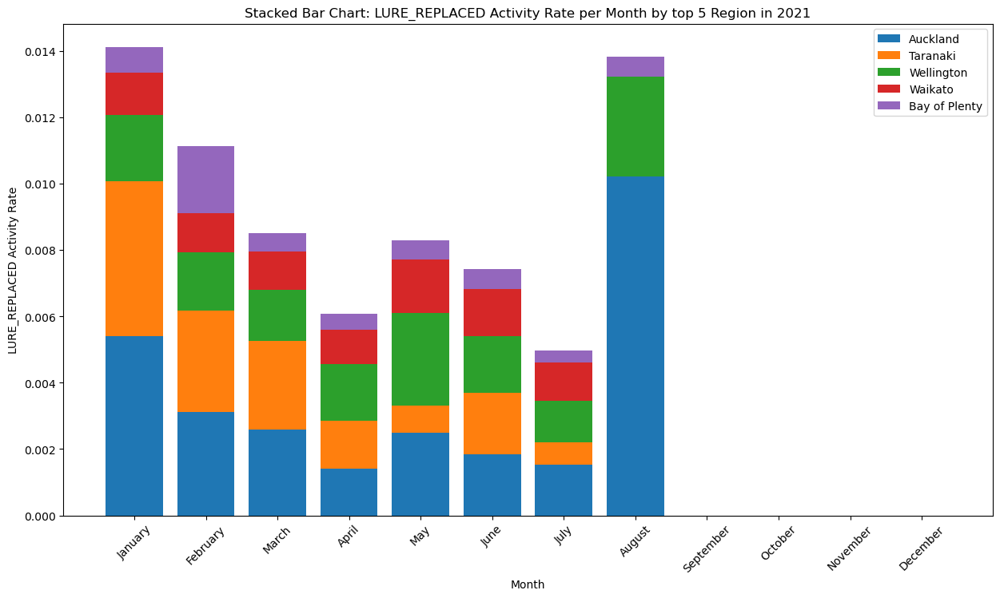

In [509]:
import matplotlib.pyplot as plt
import calendar

# Filter the dataset for the year 2019 and CO2_REPLACED activityType
df_2019 = new_df[new_df['when'].dt.year == 2021]
co2_replaced_counts_per_month = df_2019[df_2019['activityType'] == 'LURE_REPLACED'].groupby(['region', df_2019['when'].dt.month])['activityType'].count()
activity_counts_per_month = df_2019.groupby([df_2019['when'].dt.month])['activityType'].count()

# Calculate the rate of CO2_REPLACED activities per month
co2_replaced_rate_per_month = co2_replaced_counts_per_month / activity_counts_per_month

# Get the top 5 regions based on CO2_REPLACED rate
top_regions = co2_replaced_rate_per_month.groupby(level=0).mean().nlargest(5).index

# Set the figure size
plt.figure(figsize=(15, 8))

# Get unique regions
regions = df_2019['region'].unique()

# Generate a color palette for regions
color_palette = plt.cm.get_cmap('tab10')

# Get the x-axis labels (month names)
x_labels = [calendar.month_name[month] for month in range(1, 13)]

# Initialize the bottom array
bottom = None

# Plot the stacked bars for each top region
for i, region in enumerate(top_regions):
    if region in co2_replaced_rate_per_month.index.get_level_values(0):
        co2_replaced_rate = co2_replaced_rate_per_month.loc[region]
        values = co2_replaced_rate.reindex(range(1, 13), fill_value=0).values
        plt.bar(x_labels, values, bottom=bottom, label=region, color=color_palette(i))
        if bottom is None:
            bottom = values
        else:
            bottom += values

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Activity Rate')
plt.title('Stacked Bar Chart: LURE_REPLACED Activity Rate per Month by top 5 Region in 2021')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


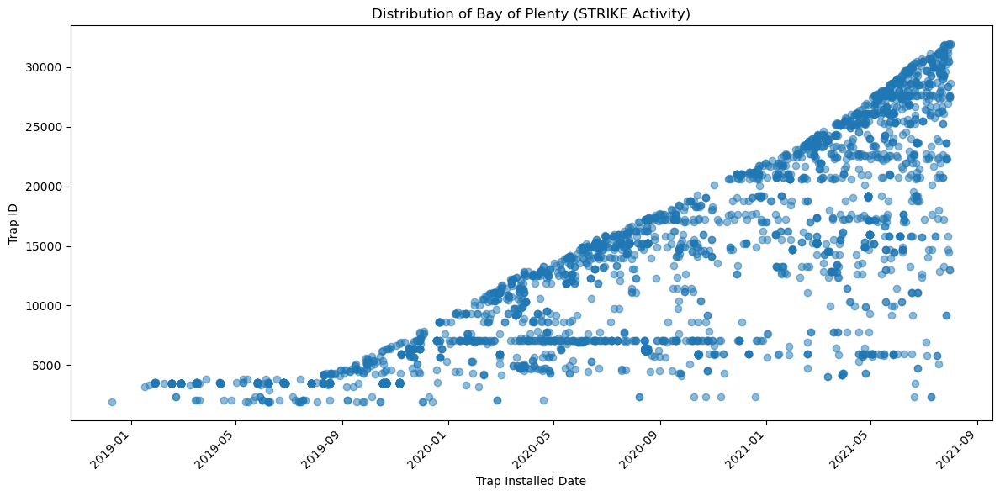

In [573]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Bay of Plenty') & (df_nz['activityType'] == 'STRIKE')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Bay of Plenty (STRIKE Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


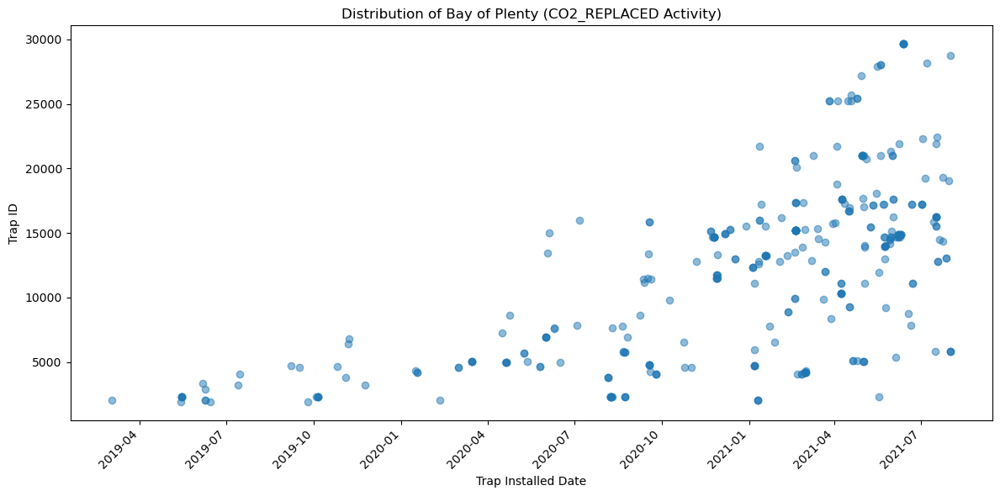

In [565]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Bay of Plenty') & (df_nz['activityType'] == 'CO2_REPLACED')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Bay of Plenty (CO2_REPLACED Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


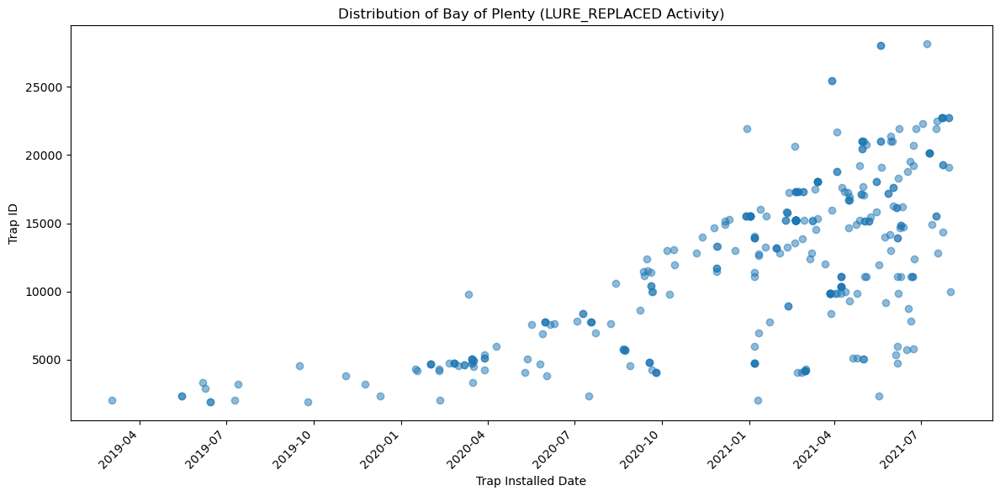

In [566]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Bay of Plenty') & (df_nz['activityType'] == 'LURE_REPLACED')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Bay of Plenty (LURE_REPLACED Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


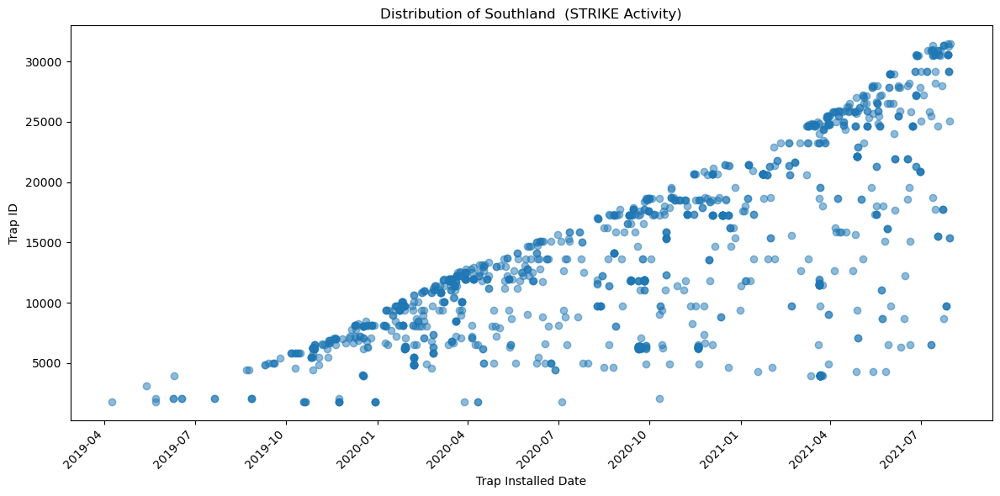

In [577]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Southland') & (df_nz['activityType'] == 'STRIKE')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Southland  (STRIKE Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


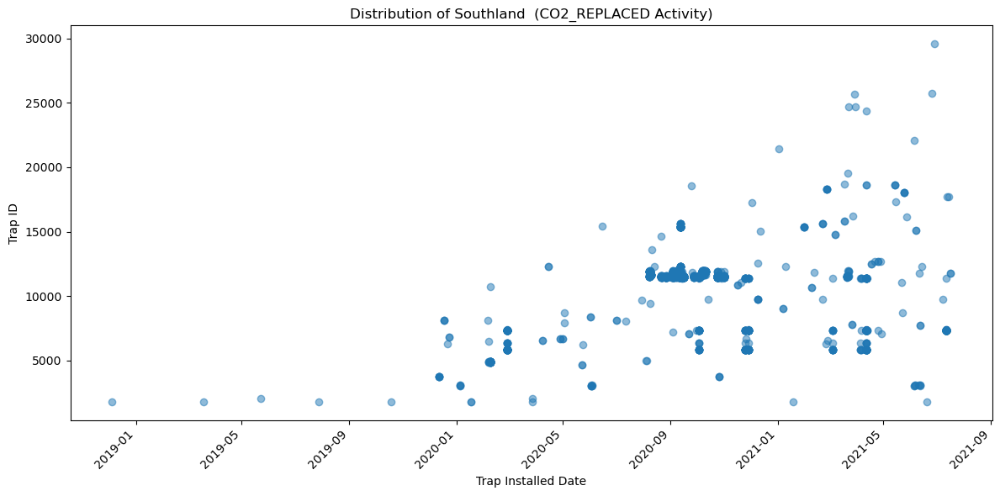

In [568]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Southland') & (df_nz['activityType'] == 'CO2_REPLACED')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Southland  (CO2_REPLACED Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


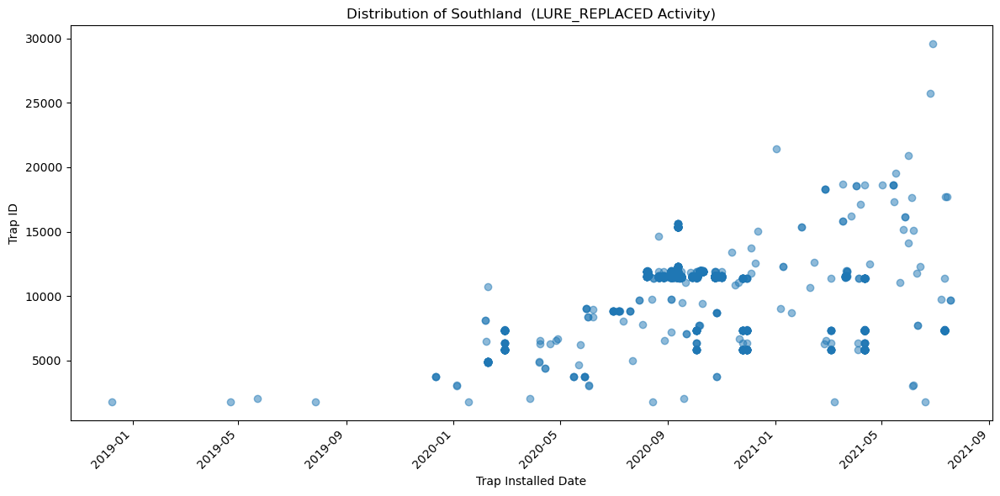

In [570]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Southland') & (df_nz['activityType'] == 'LURE_REPLACED')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Southland  (LURE_REPLACED Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


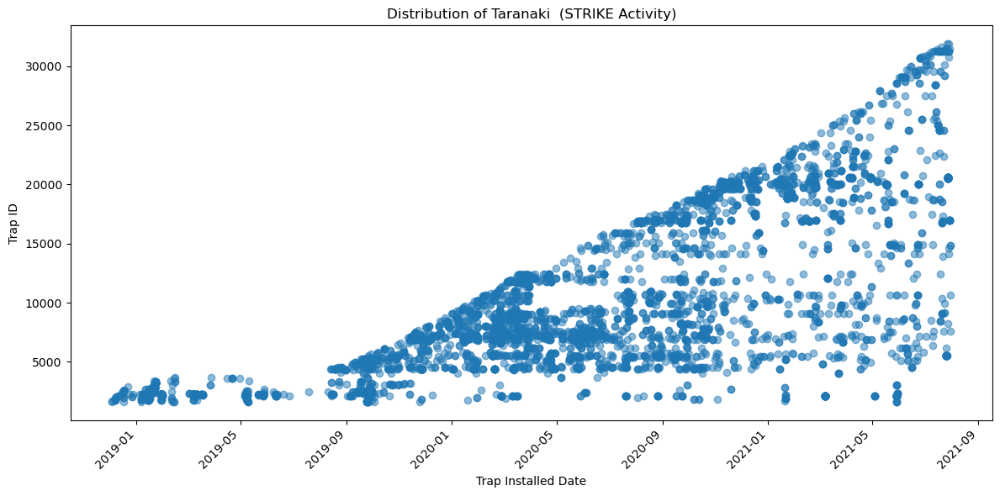

In [578]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Taranaki') & (df_nz['activityType'] == 'STRIKE')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Taranaki  (STRIKE Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


### Findings and analysis

In [631]:
import pandas as pd

# Filter the dataset for the Taranaki region
df_taranaki = df_nz[df_nz['region'] == 'Taranaki']

# Convert the 'when' column to datetime
df_taranaki['when'] = pd.to_datetime(df_taranaki['when'])

# Filter the dataset for the months of January 2019 to June 2019
start_date = pd.to_datetime('2019-01-01').tz_localize('UTC')
end_date = pd.to_datetime('2019-06-30').tz_localize('UTC')
df_filtered = df_taranaki[(df_taranaki['when'] >= start_date) & (df_taranaki['when'] <= end_date)]

# Print the filtered dataframe
df_filtered['landUse'].value_counts()


C:\Users\psych\AppData\Local\Temp\ipykernel_8784\2483929265.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_taranaki['when'] = pd.to_datetime(df_taranaki['when'])


Grassland                       999
Settlements or built-up area    166
Forest                          105
Cropland                         11
Name: landUse, dtype: int64

In [632]:
# Group the data by month, trapId, landUse, region, and city, and count the occurrences of 'STRIKE'
strike_totals_per_month = df_filtered[df_filtered['activityType'] == 'STRIKE'].groupby([df_filtered['when'].dt.month, 'trapId', 'landUse', 'region', 'city', 'latitude', 'longitude'])['activityType'].count()

# Reset the index to convert the result into a DataFrame
strike_totals_per_month = strike_totals_per_month.reset_index()

# Rename the columns
strike_totals_per_month.columns = ['Month', 'trapId', 'Land Use', 'Region', 'City', 'Latitude', 'Longitude', 'Strike Total']

# Sort the DataFrame by 'Strike Total' in descending order, and then by 'Month'
strike_totals_per_month = strike_totals_per_month.sort_values(by=['Strike Total', 'Month'], ascending=[False, True])

# Print the strike totals per month
# strike_totals_per_month[strike_totals_per_month['trapId'] == 2273]
# strike_totals_per_month[strike_totals_per_month['Month'] == 5]
# strike_totals_per_month['Land Use'].value_counts()

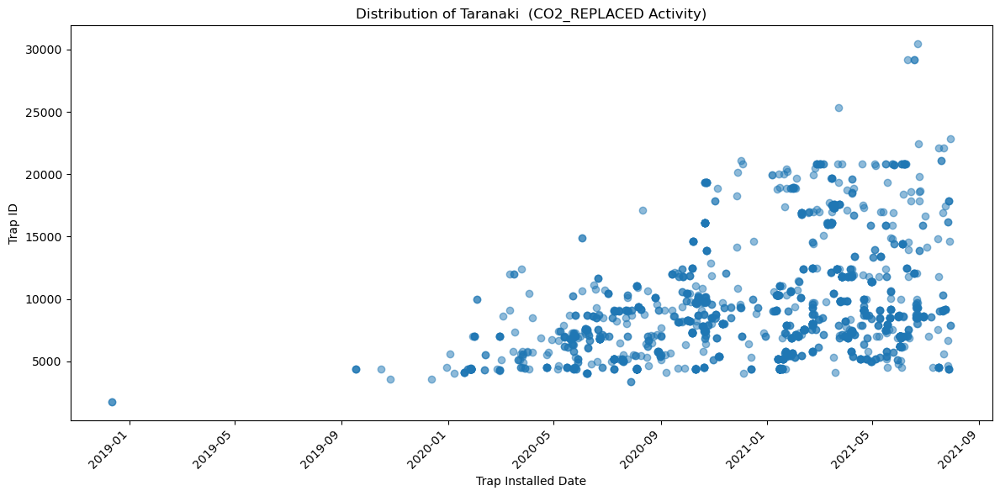

In [571]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Taranaki') & (df_nz['activityType'] == 'CO2_REPLACED')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Taranaki  (CO2_REPLACED Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


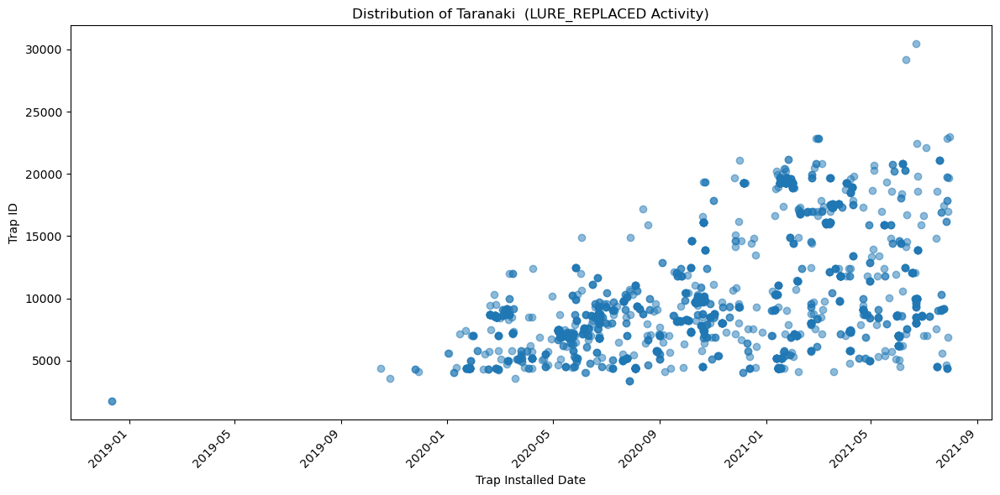

In [572]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for Auckland and STRIKE activity
df_auckland_strike = df_nz[(df_nz['region'] == 'Taranaki') & (df_nz['activityType'] == 'LURE_REPLACED')]

# Extract trapId and trapInstalledAT columns
trap_ids = df_auckland_strike['trapId']
trap_dates = pd.to_datetime(df_auckland_strike['when']).dt.date

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the scatter plot
plt.scatter(trap_dates, trap_ids, alpha=0.5)

# Set the labels and title
plt.xlabel('Trap Installed Date')
plt.ylabel('Trap ID')
plt.title('Distribution of Taranaki  (LURE_REPLACED Activity)')

# Rotate and align the x-axis labels
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()


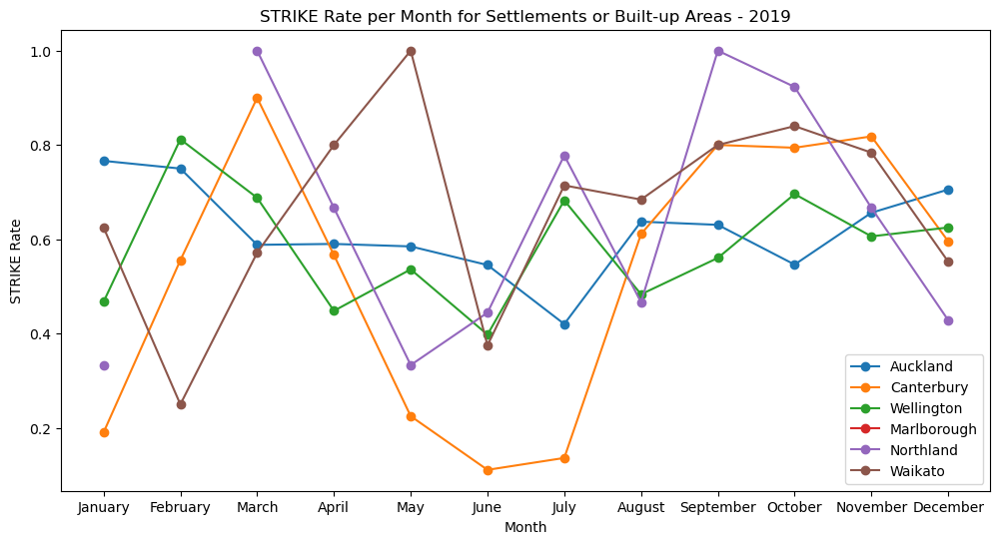

In [63]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('STRIKE Rate')
plt.title('STRIKE Rate per Month for Settlements or Built-up Areas - 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


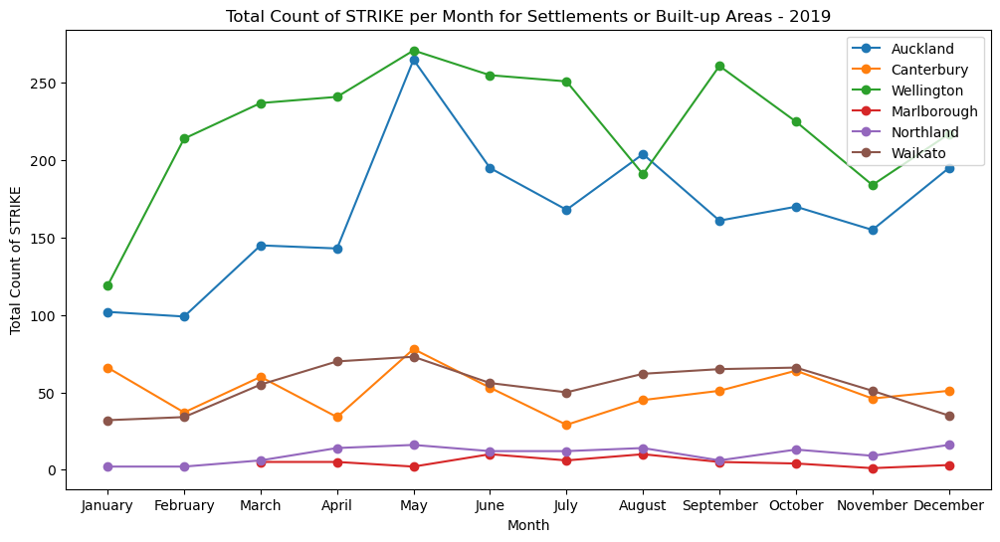

In [65]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the total count of 'STRIKE'
strike_counts = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = strike_counts.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('Total Count of STRIKE')
plt.title('Total Count of STRIKE per Month for Settlements or Built-up Areas - 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


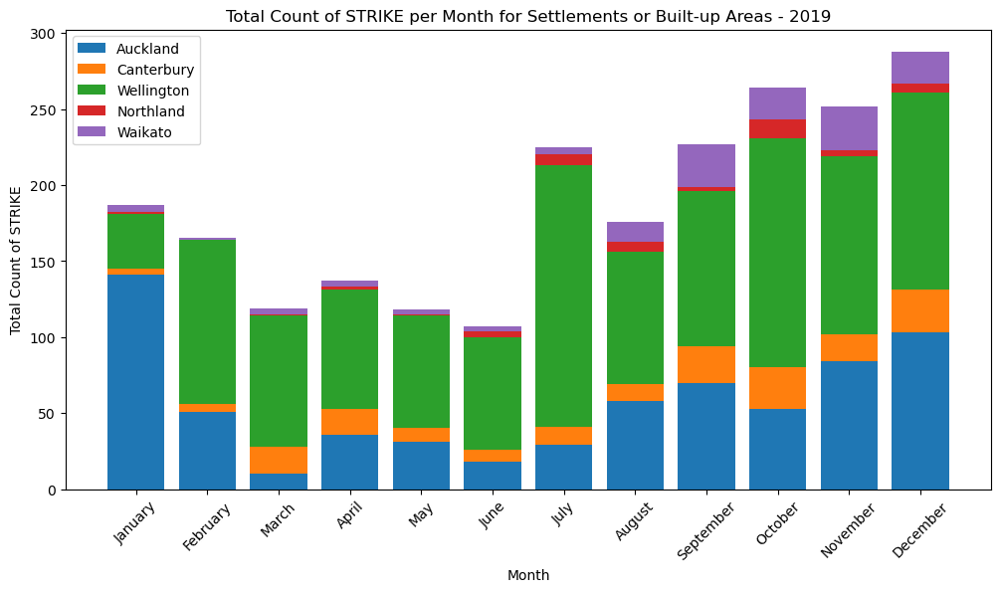

In [67]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the total count of 'STRIKE'
strike_counts = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()

# Set the figure size
plt.figure(figsize=(12, 6))

# Get the x-axis labels (month names)
x_labels = [calendar.month_name[i] for i in range(1, 13)]

# Initialize the bottom array
bottom = None

# Plot the stacked bars for each region
for region in regions:
    region_data = strike_counts.loc[region]
    values = region_data.reindex(range(1, 13), fill_value=0).values
    plt.bar(x_labels, values, bottom=bottom, label=region)
    if bottom is None:
        bottom = values
    else:
        bottom += values

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('Total Count of STRIKE')
plt.title('Total Count of STRIKE per Month for Settlements or Built-up Areas - 2019')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Display the plot
plt.show()


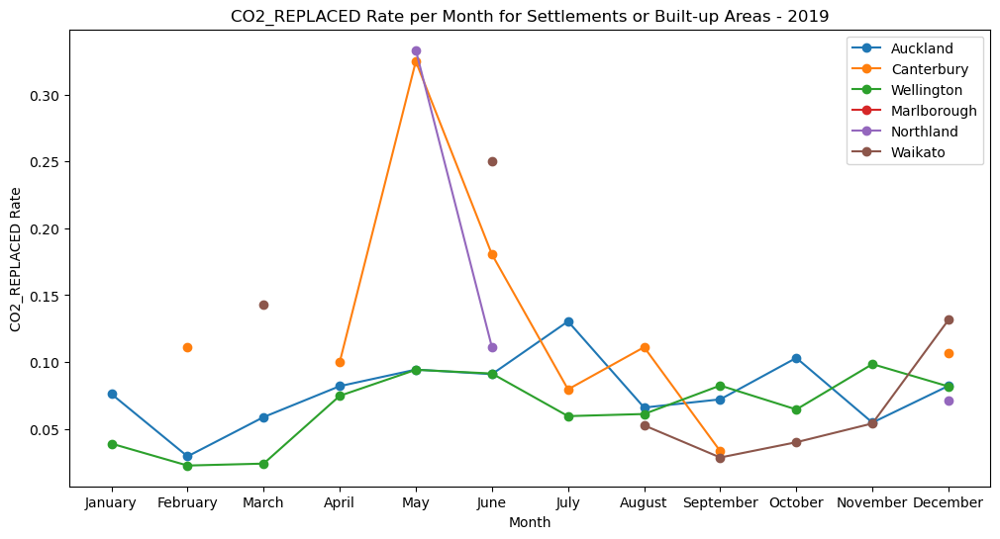

In [666]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'CO2_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month for Settlements or Built-up Areas - 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


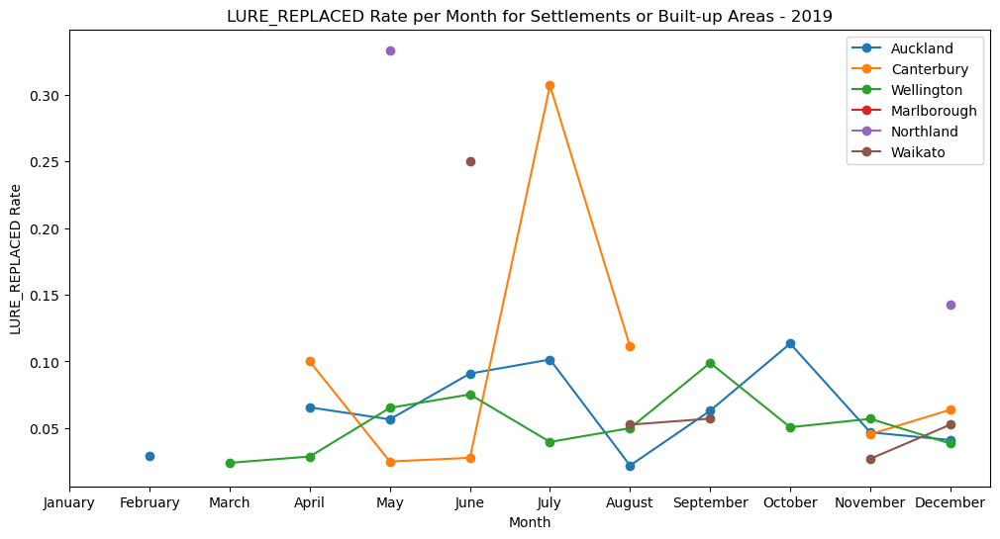

In [667]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'LURE_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month for Settlements or Built-up Areas - 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


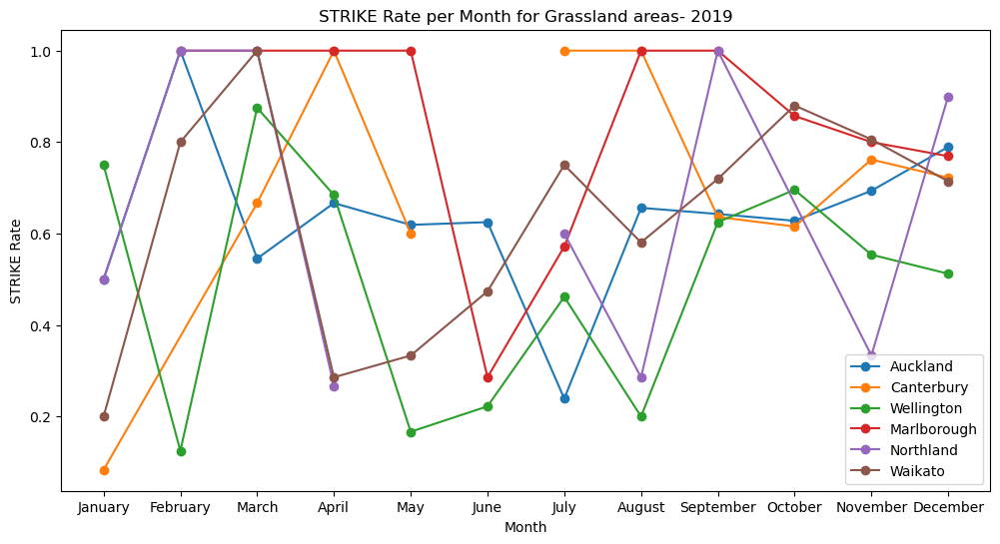

In [669]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Grassland'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('STRIKE Rate')
plt.title('STRIKE Rate per Month for Grassland areas- 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


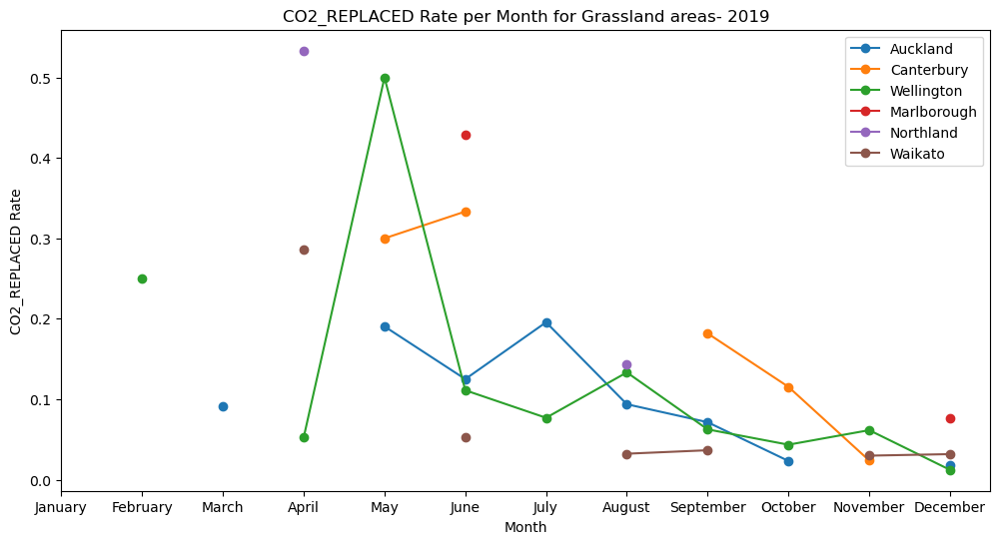

In [670]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Grassland'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'CO2_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month for Grassland areas- 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


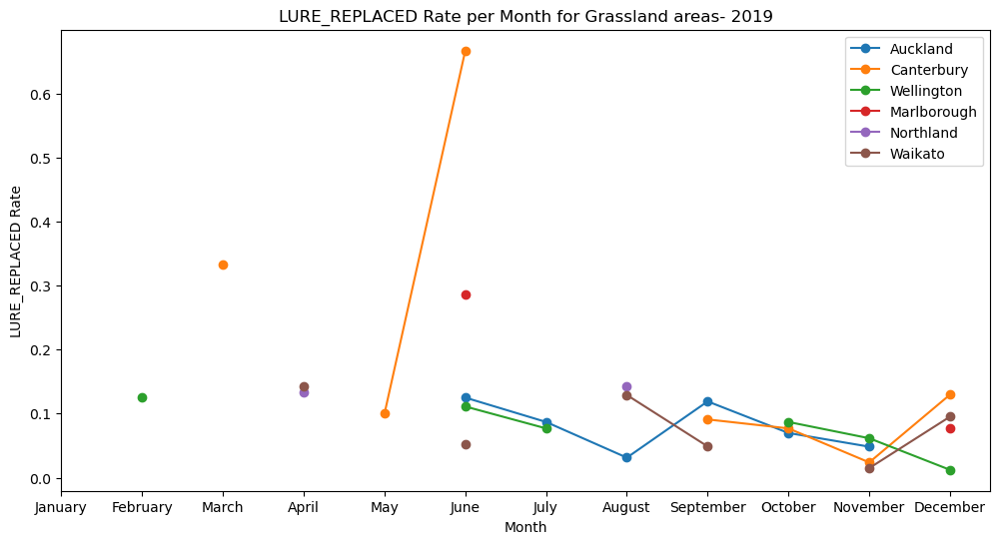

In [671]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Grassland'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'LURE_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month for Grassland areas- 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


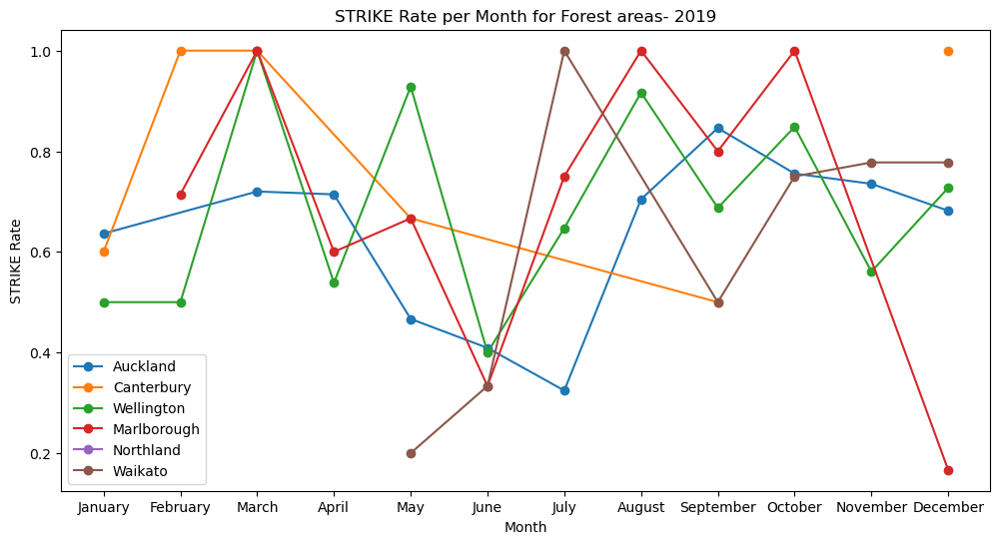

In [672]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('STRIKE Rate')
plt.title('STRIKE Rate per Month for Forest areas- 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


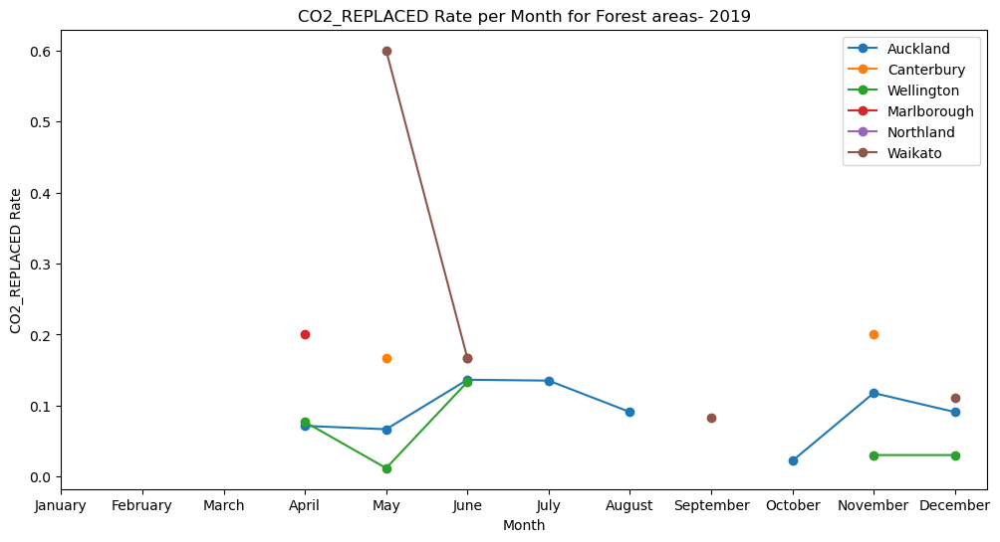

In [673]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'CO2_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month for Forest areas- 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


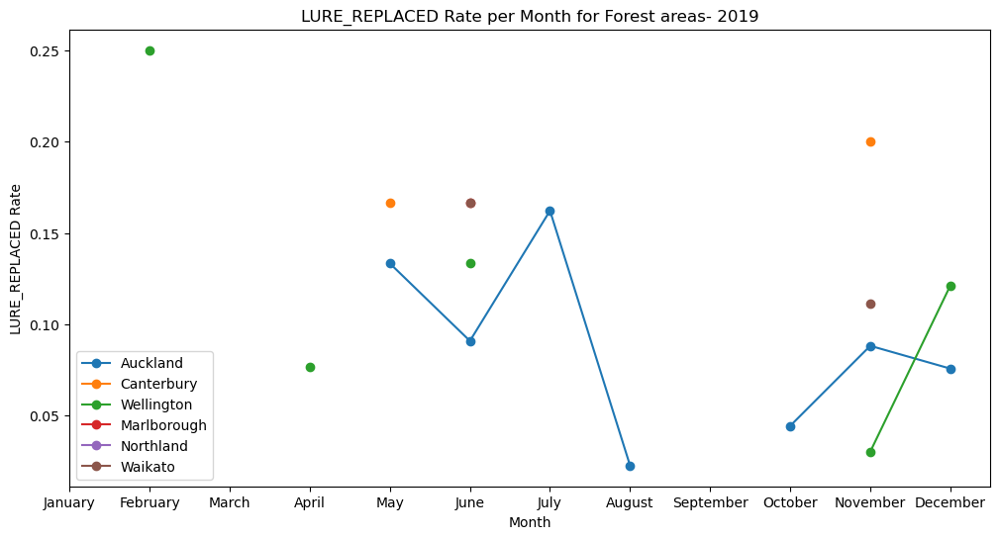

In [674]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'LURE_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month for Forest areas- 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


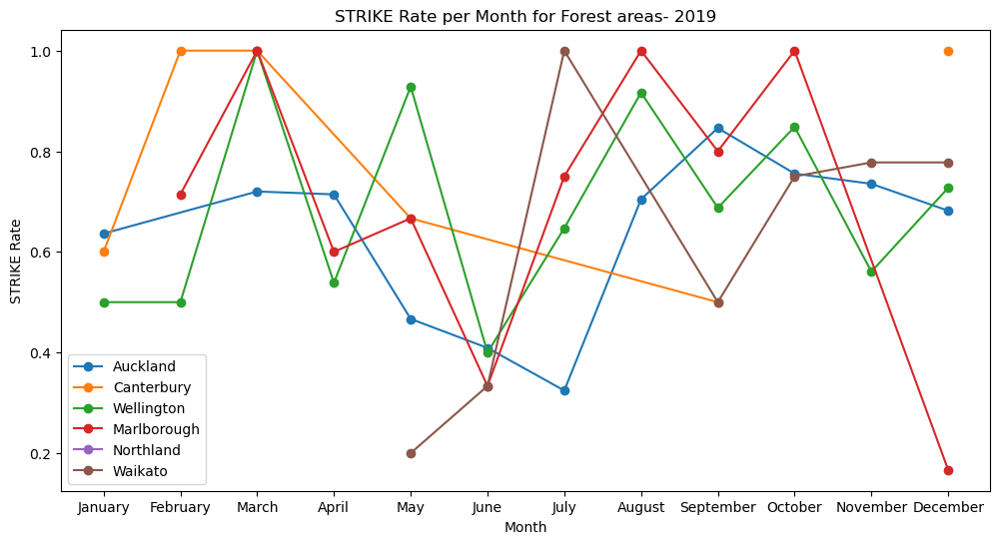

In [675]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Canterbury', 'Wellington', 'Marlborough', 'Northland', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2019)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('STRIKE Rate')
plt.title('STRIKE Rate per Month for Forest areas- 2019')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


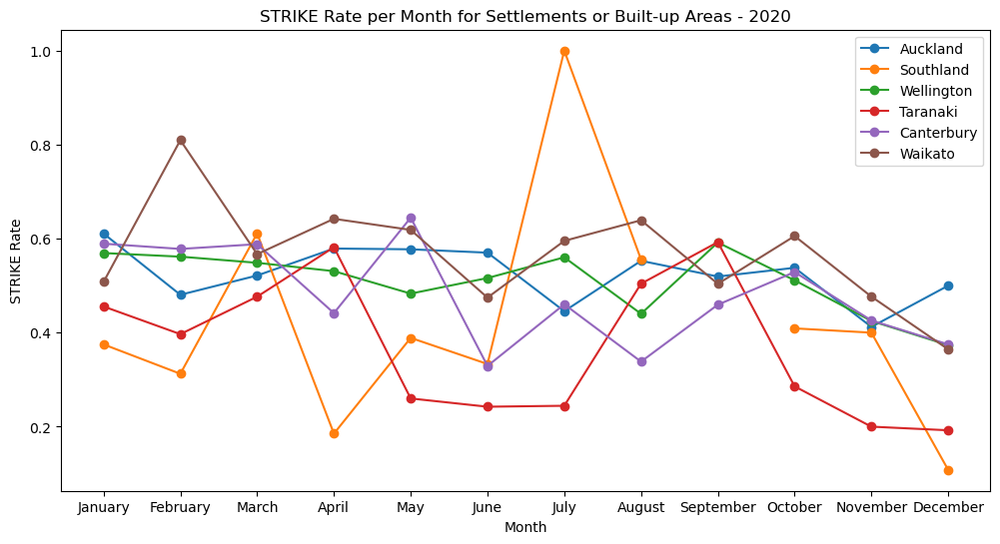

In [679]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('STRIKE Rate')
plt.title('STRIKE Rate per Month for Settlements or Built-up Areas - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


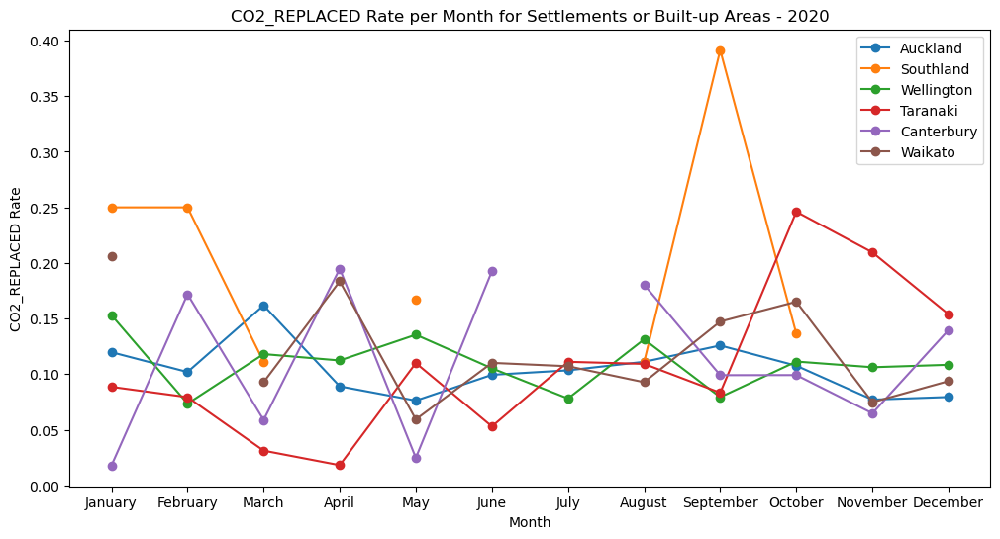

In [680]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'CO2_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month for Settlements or Built-up Areas - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


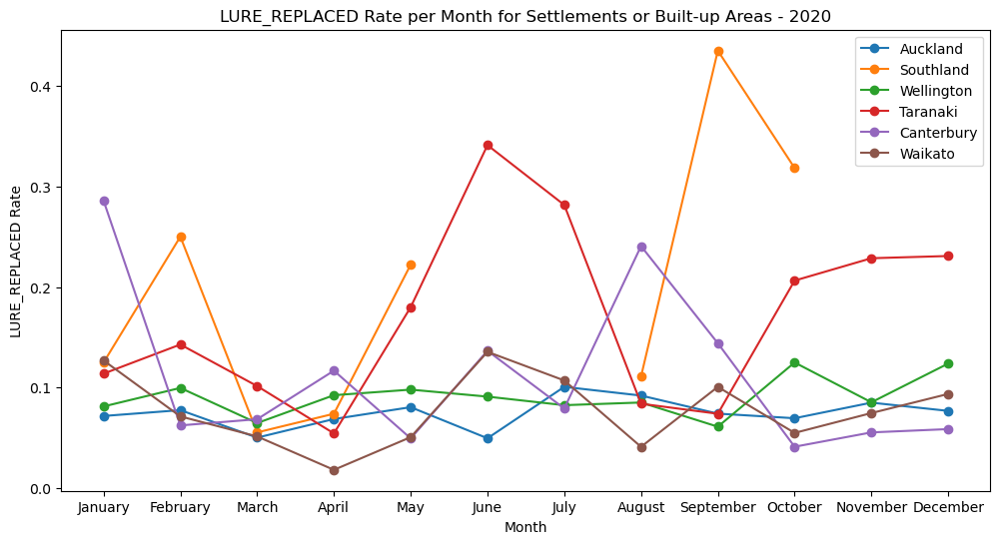

In [681]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Settlements or built-up area'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'LURE_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month for Settlements or Built-up Areas - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


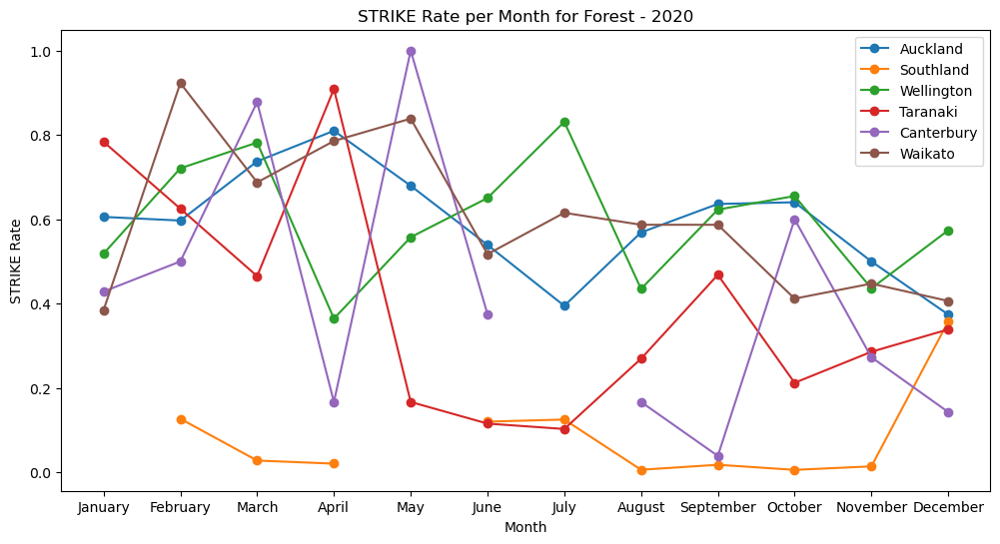

In [684]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('STRIKE Rate')
plt.title('STRIKE Rate per Month for Forest - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


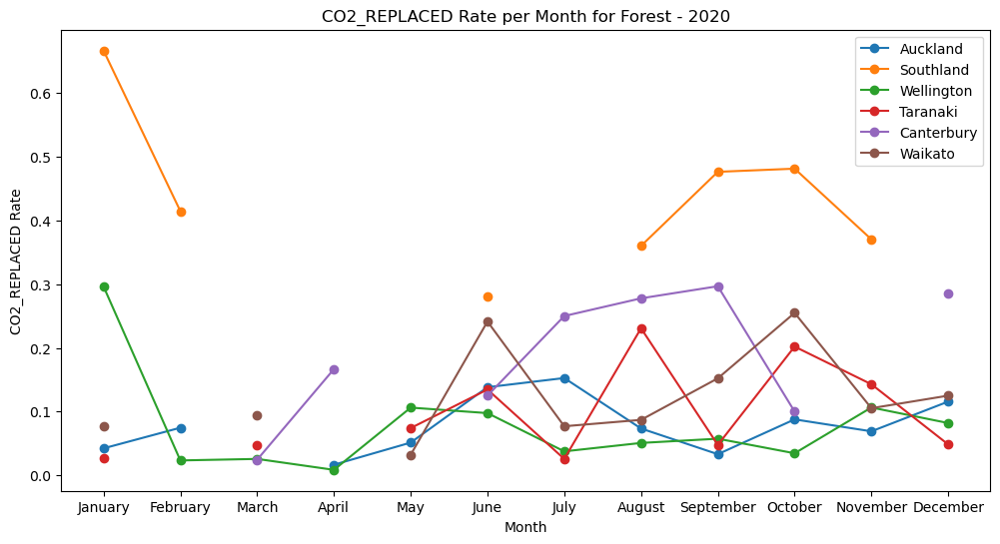

In [685]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'CO2_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month for Forest - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


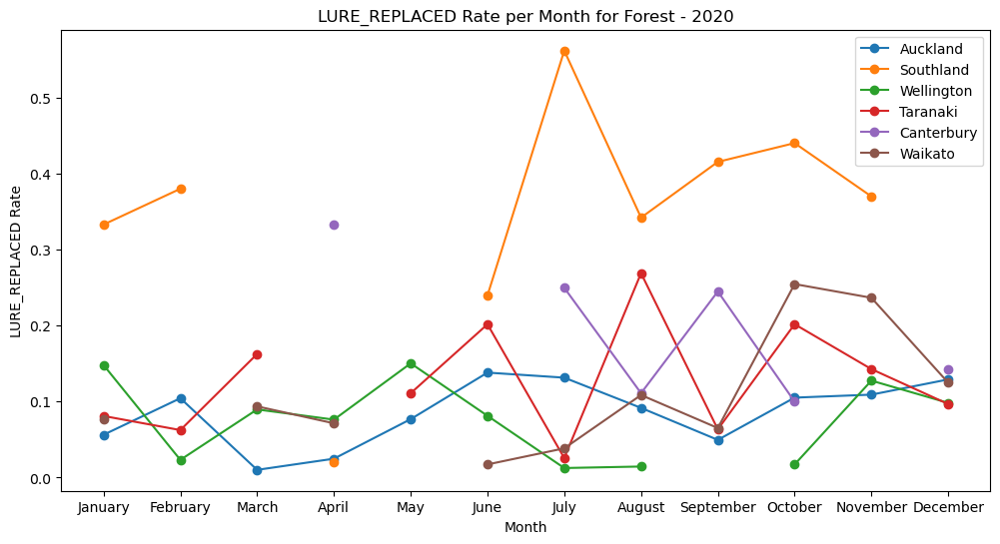

In [686]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'LURE_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month for Forest - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


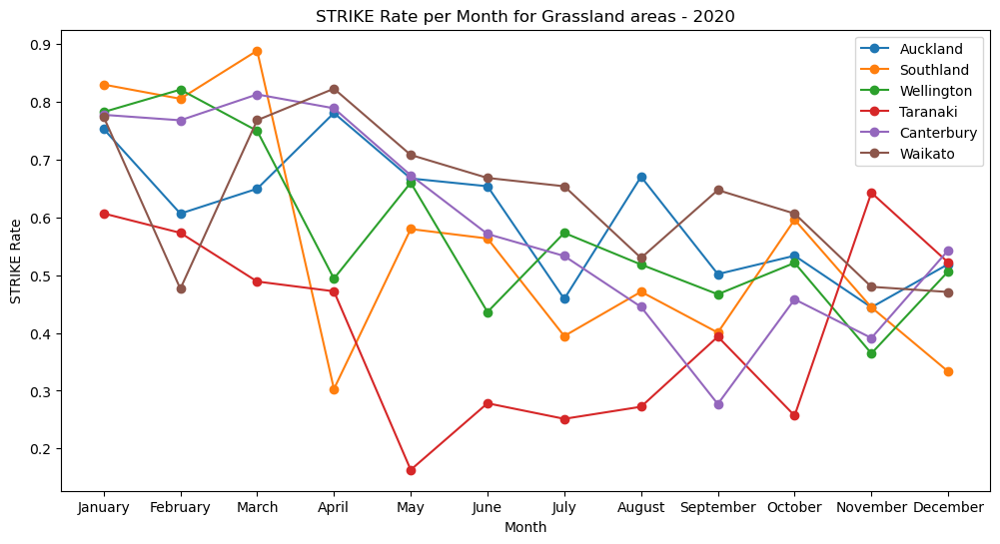

In [689]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Grassland'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('STRIKE Rate')
plt.title('STRIKE Rate per Month for Grassland areas - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


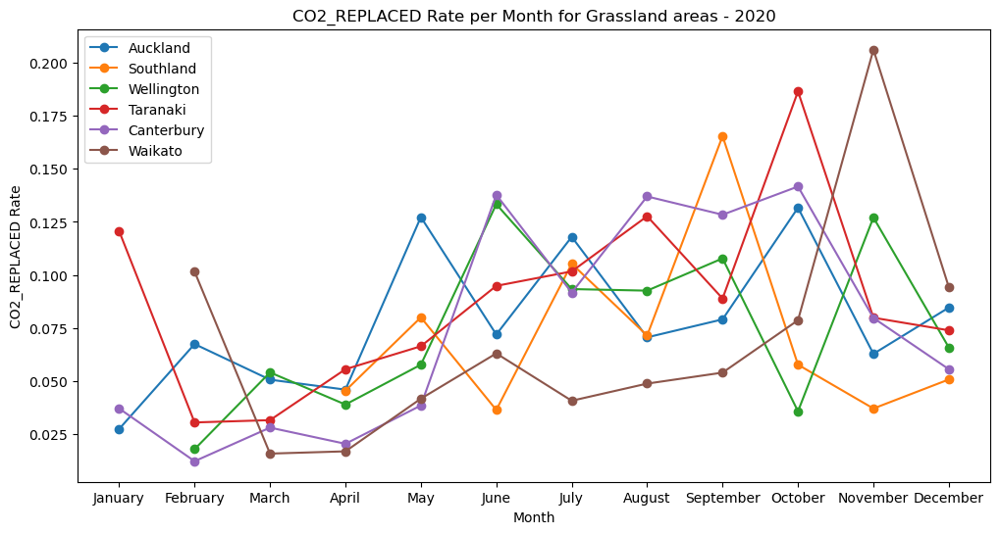

In [690]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Grassland'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'CO2_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('CO2_REPLACED Rate')
plt.title('CO2_REPLACED Rate per Month for Grassland areas - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


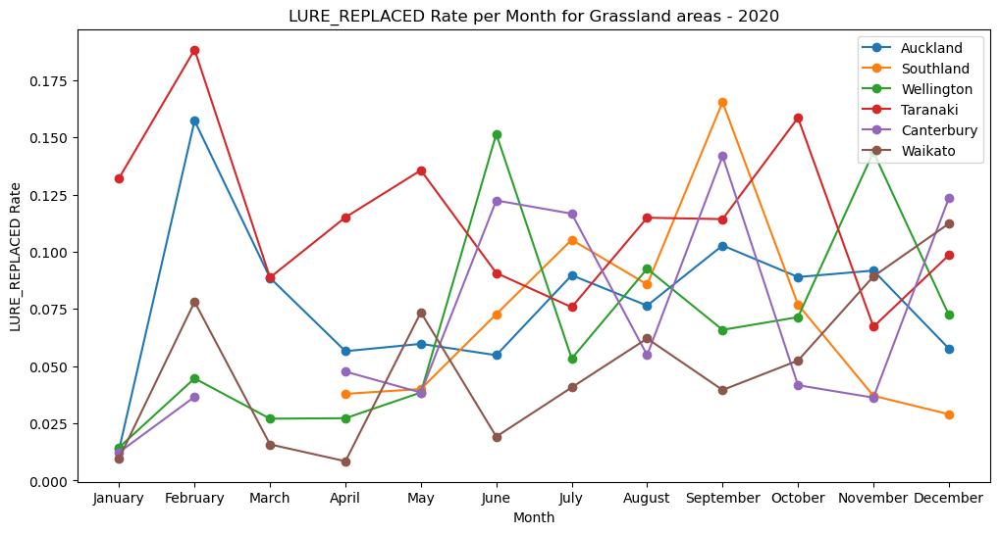

In [691]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Southland', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Grassland'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2020)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'LURE_REPLACED'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month for Grassland areas - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


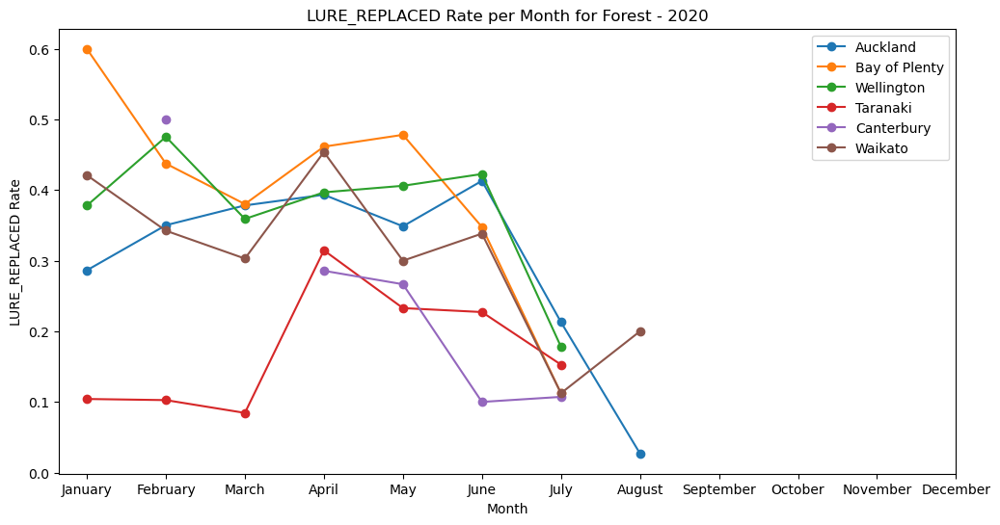

In [687]:
import matplotlib.pyplot as plt
import calendar

# Define the regions
regions = ['Auckland', 'Bay of Plenty', 'Wellington', 'Taranaki', 'Canterbury', 'Waikato']

# Define the land use type
land_use = 'Forest'

# Filter the dataset for the specified regions and land use type
filtered_df = df_nz[df_nz['region'].isin(regions) & (df_nz['landUse'] == land_use) & (df_nz['when'].dt.year == 2021)]

# Group the data by region and month, and calculate the CO2_REPLACED rate
co2_replaced_rates = filtered_df[filtered_df['activityType'] == 'STRIKE'].groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
activity_counts = filtered_df.groupby(['region', filtered_df['when'].dt.month])['activityType'].count()
co2_replaced_rate = co2_replaced_rates / activity_counts

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the lines for each region
for region in regions:
    region_data = co2_replaced_rate.loc[region]
    plt.plot(region_data.index, region_data.values, marker='o', label=region)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('LURE_REPLACED Rate')
plt.title('LURE_REPLACED Rate per Month for Forest - 2020')

# Set the x-axis tick labels as month names
plt.xticks(range(1, 13), [calendar.month_name[i] for i in range(1, 13)])

# Add a legend
plt.legend()

# Display the plot
plt.show()


### LURE replaced per time period per anuum (2019- 2021)

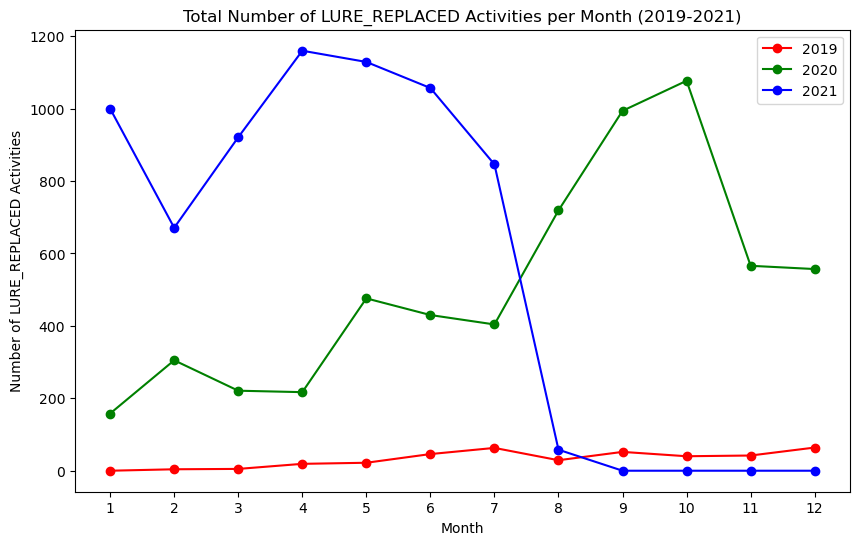

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter the dataset for the years 2019-2021 and activityType 'LURE_REPLACED'
df_lure_replaced = new_df[(new_df['when'].dt.year >= 2019) & (new_df['when'].dt.year <= 2021) & (new_df['activityType'] == 'LURE_REPLACED')]

# Group the data by year and month and count the number of LURE_REPLACED activities for each group
lure_replaced_counts_per_month = df_lure_replaced.groupby([df_lure_replaced['when'].dt.year, df_lure_replaced['when'].dt.month])['activityType'].count()

# Set the figure size
plt.figure(figsize=(10, 6))

# Get the unique years in the dataset
years = lure_replaced_counts_per_month.index.get_level_values(0).unique()

# Define colors for each year
colors = ['red', 'green', 'blue']

# Plot the line chart with dots for each year
for i, year in enumerate(years):
    year_data = lure_replaced_counts_per_month.loc[year]
    x_labels = [f'{month}' for month in range(1, 13)]  # All 12 months
    x_positions = range(1, len(x_labels) + 1)
    plt.plot(x_positions, year_data.reindex(range(1, 13), fill_value=0).values, marker='o', linestyle='-', color=colors[i], label=str(year))

# Set the x-axis tick positions and labels
plt.xticks(x_positions, x_labels)

# Set the labels and title
plt.xlabel('Month')
plt.ylabel('Number of LURE_REPLACED Activities')
plt.title('Total Number of LURE_REPLACED Activities per Month (2019-2021)')

# Add a legend
plt.legend()

# Display the plot
plt.show()


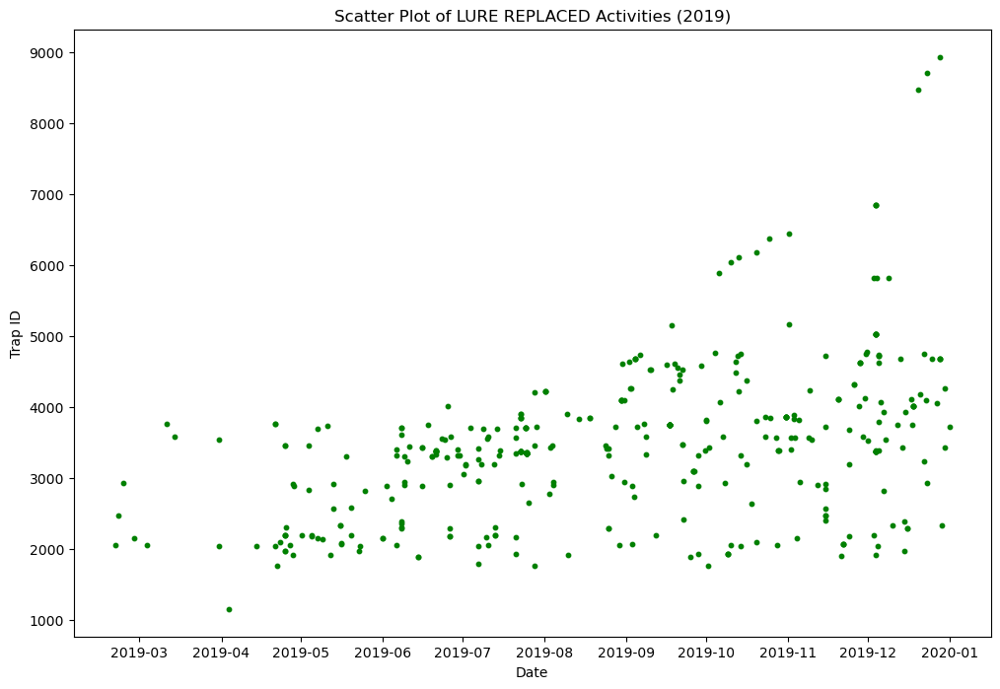

In [176]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = new_df[(new_df['when'].dt.year == 2019) & (new_df['activityType'] == 'LURE_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='GREEN', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of LURE REPLACED Activities (2019)')

# Display the plot
plt.show()


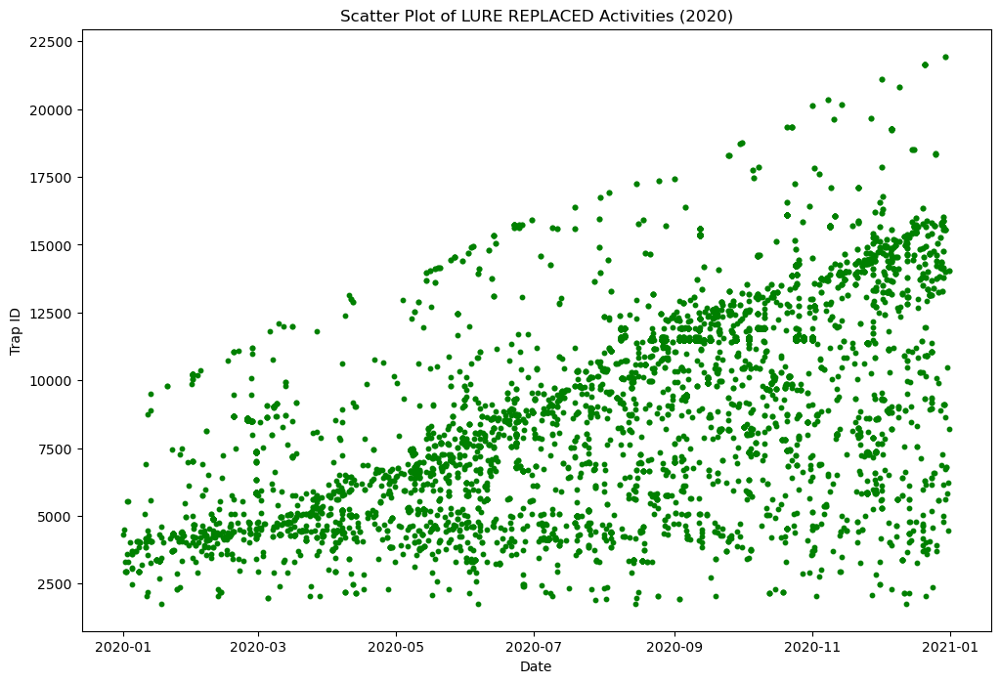

In [188]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = new_df[(new_df['when'].dt.year == 2020) & (new_df['activityType'] == 'LURE_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='GREEN', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of LURE REPLACED Activities (2020)')

# Display the plot
plt.show()

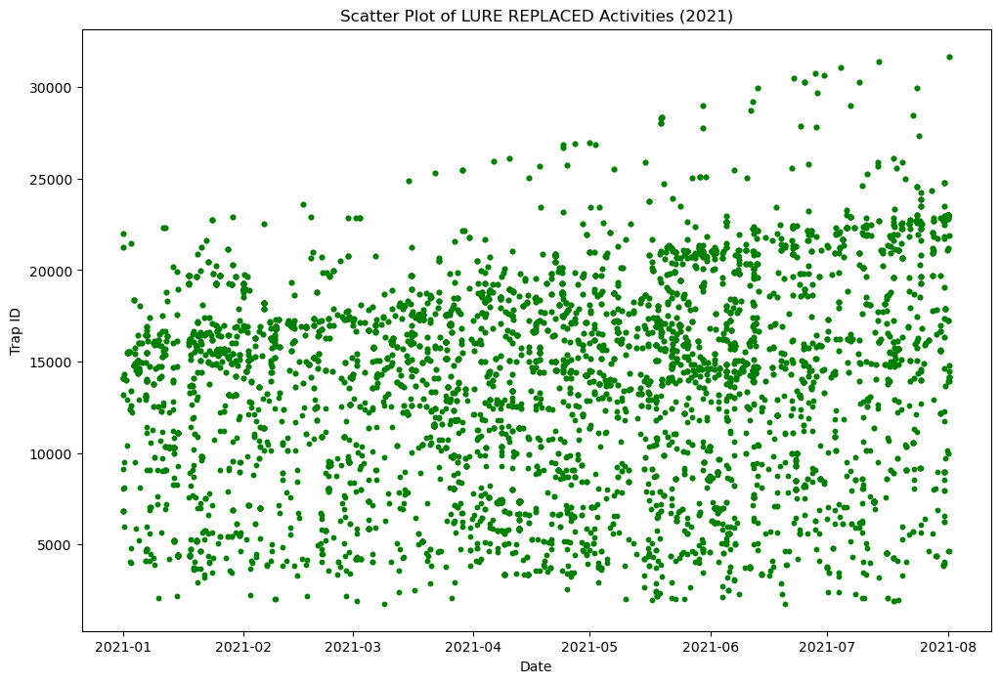

In [189]:
import matplotlib.pyplot as plt

# Filter the dataset for years 2019-2021 and activityType 'STRIKE'
df_co2rep = new_df[(new_df['when'].dt.year == 2021) & (new_df['activityType'] == 'LURE_REPLACED')]

# Set the figure size
plt.figure(figsize=(12, 8))

# Plot the scatter plot
plt.scatter(df_co2rep['when'], df_co2rep['trapId'], c='GREEN', s=10)

# Set the labels and title
plt.xlabel('Date')
plt.ylabel('Trap ID')
plt.title('Scatter Plot of LURE REPLACED Activities (2021)')

# Display the plot
plt.show()